# Sparse and Low-Dimensional Models for High-Dimensional Data

# Project - Musical Style Transcription

## Setup

In [1]:
# Import all required libraries
import os
import shutil
import librosa as lb
import soundfile as sf
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow.keras as krs
import tensorflow_probability as tfp
import sys
import json
from numba import cuda
from sklearn.model_selection import train_test_split


from IPython.display import Audio, display

2023-10-24 16:23:53.237860: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-10-24 16:23:53.237926: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-10-24 16:23:53.237970: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-10-24 16:23:53.247789: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
tf.config.list_physical_devices('GPU')

2023-10-24 16:23:56.276813: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:894] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-10-24 16:23:56.288649: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:894] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-10-24 16:23:56.291718: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:894] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [3]:
# Constants

## Data dirs
data_path = "./"
raw_data_path = os.path.join(data_path, "raw_data")
raw_classical_path = os.path.join(raw_data_path, "classical")
raw_jazz_path = os.path.join(raw_data_path, "jazz")
cut_data_path = os.path.join(data_path, "cut")
cut_classical_path = os.path.join(cut_data_path, "classical")
cut_jazz_path = os.path.join(cut_data_path, "jazz")

# Preprocessing settings
n_secs = 1
cut_classical_path = os.path.join(cut_classical_path, f"{n_secs}s")
cut_jazz_path = os.path.join(cut_jazz_path, f"{n_secs}s")

## Domain sizes
default_sample_rate = 44100
default_n_fft = 2048
default_n_mels = 256
default_n_mfcc = 256

In [4]:
# Loss functions
cosine_loss = krs.losses.CosineSimilarity(axis=[1, 2])
msle_loss = krs.losses.MeanSquaredLogarithmicError()
kl_loss = krs.losses.KLDivergence()
mse_loss = krs.losses.MeanSquaredError()
crossentropy_loss = krs.losses.BinaryCrossentropy()

## Utilities and Helpers

In [5]:
# Audio helper functions
def read_audio(audio_path: os.PathLike, sr = default_sample_rate, mono=True, **kwargs):
    audio, _ = lb.load(audio_path, sr=sr, mono=mono, **kwargs)
    return audio

def write_audio(audio, audio_path: os.PathLike, sr = default_sample_rate, **kwargs):
    sf.write(audio_path, audio, sr, **kwargs)

def play_audio(audio, sr = default_sample_rate):
    player = Audio(data=audio, rate=sr)
    return display(player)

In [6]:
# Ploting helper functions
def make_figax(n_h=1, n_v=1, w_fig=8, h_fig=4.5):
    fig, ax = plt.subplots(n_v, n_h, figsize=(w_fig * n_h, h_fig * n_v))
    return fig, ax

def style_figax(fig, ax, grid = True):
    ax.grid(grid)
    fig.tight_layout()
    return fig, ax

def plot_audio(x, fn=None, sr=default_sample_rate, fig=None, ax=None):
    if fig is None or ax is None:
        fig, ax = make_figax()

    if fn is None:
        fn = lambda x: x

    time = np.linspace(0, len(x) / sr, len(x))
    ax.plot(time, fn(x))
    ax.set_xlabel("Time")
    ax.set_ylabel("Audio")

    return fig, ax

def plot_spectral_feature(feature, fn=lambda x: 20 * np.log10(x + 1e-3), fig=None, ax=None):
    if fig is None or ax is None:
        fig, ax = make_figax()

    if fn is None:
        fn = lambda x: x

    img = ax.imshow(np.transpose(fn(feature)), origin="lower", aspect="auto", interpolation="none")
    plt.colorbar(img, ax=ax)

    return fig, ax

def plot_autoencoder_history(history, fig = None, ax = None):
    if not isinstance(history, dict):
        history = history.history
    loss = history["loss"]
    val_loss = history["val_loss"]
    
    if fig is None or ax is None:
        fig, ax = make_figax()
    
    ax.plot(loss, label="Training Loss")
    ax.plot(val_loss, label="Validation Loss")
    ax.legend()
    ax.grid(True)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    
    return fig, ax   

In [7]:
# Domain transform helper functions
def pad_signal(x, n_fft = default_n_fft):
    x_padded = lb.util.fix_length(x, size=len(x) + n_fft // 2)
    return x_padded

def compute_stft(x, n_fft = default_n_fft, **kwargs):
    x_padded = pad_signal(x, n_fft=n_fft)
    x_stft = lb.stft(x_padded, n_fft=n_fft, **kwargs)
    return np.transpose(x_stft)

def compute_istft(x_stft, n_fft = default_n_fft, **kwargs):
    x_istft = lb.istft(np.transpose(x_stft), n_fft=n_fft, **kwargs)
    return x_istft

def compute_mels(x, n_fft = default_n_fft, n_mels = default_n_mels, sr = default_sample_rate, **kwargs):
    x_padded = pad_signal(x, n_fft=n_fft)
    x_mels = lb.feature.melspectrogram(y=x_padded, sr=sr, n_mels=n_mels, n_fft=n_fft, **kwargs)
    return np.transpose(x_mels)

def compute_imels(x_mels, n_fft = default_n_fft, sr = default_sample_rate, **kwargs):
    x_imels = lb.feature.inverse.mel_to_audio(np.transpose(x_mels), sr=sr, n_fft=n_fft, **kwargs)
    return x_imels

def compute_mfcc(x, sr=default_sample_rate, n_fft = default_n_fft, n_mels = default_n_mels, n_mfcc = default_n_mfcc, **kwargs):
    x_padded = pad_signal(x, n_fft=n_fft)
    x_mfcc = lb.feature.mfcc(y=x_padded, sr=sr, n_fft=n_fft, n_mels=n_mels, n_mfcc=n_mfcc, **kwargs)
    return np.transpose(x_mfcc)

def compute_imfcc(x_mfcc, sr=default_sample_rate, n_fft = default_n_fft, n_mels = default_n_mels, **kwargs):
    x_imfcc = lb.feature.inverse.mfcc_to_audio(np.transpose(x_mfcc), sr=sr, n_mels=n_mels, n_fft=n_fft, **kwargs)
    return x_imfcc

## Raw Data Preprocessing

In [8]:
def cut_audio_file(source_file: str, source_dir: str, target_dir: str, segment_duration: int = n_secs, target_loudness: float = -20, sr=default_sample_rate, force_power_of_2 = True):
  # File name & path
  file_name, file_ext = os.path.splitext(source_file)
  source_path = os.path.join(source_dir, source_file)
  if os.path.exists(os.path.join(target_dir, f"{file_name}_0.wav")):
    print(f"File already processed: {source_file}")
  else:
    print(f"Processing file: {source_file}")

  # Read input file (mono @ target_sample_rate)
  audio = read_audio(source_path, sr=sr)

  # Equalize loudness
  current_rms = np.sqrt(np.mean(audio**2))
  target_rms = 10**(target_loudness/20)
  audio_normalized = audio * target_rms / current_rms

  # Compute the number of samples per segment
  samples_per_segment = int(sr * segment_duration)
  if force_power_of_2:
    # Pick the number of samples per segment that is nearest to a power of 2 (better for FFT transforms)
    samples_per_segment = 2**round(np.log2(samples_per_segment))
  n_segments = int(len(audio_normalized) / samples_per_segment)

  # Split into segments & save to file
  for i in range(n_segments):
    # split segment
    segment = audio_normalized[i*samples_per_segment:(i+1)*samples_per_segment]

    # construct output path
    target_file = f"{file_name}_{i}.wav"
    target_path = os.path.join(target_dir, target_file)

    # Write output
    write_audio(segment, target_path, sr=sr)


  return n_segments

In [13]:
# Uncomment if you really want to run this
assert False, "Sure you want to run this?"

# Reset preprocessed data
if os.path.exists(cut_data_path):
  shutil.rmtree(cut_classical_path)
  shutil.rmtree(cut_jazz_path)
os.makedirs(cut_classical_path, exist_ok=True)
os.makedirs(cut_jazz_path, exist_ok=True)

AssertionError: Sure you want to run this?

In [14]:
# Bulk processingg n samples per genre
n_samples_per_genre = np.inf

raw_paths = [raw_classical_path, raw_jazz_path]
cut_paths = [cut_classical_path, cut_jazz_path]
for raw_path, cut_path in zip(raw_paths, cut_paths):
  # Read files
  raw_files = os.listdir(raw_path)

  # Process limited files
  n_samples = min(n_samples_per_genre, len(raw_files))
  raw_files = np.random.choice(raw_files, size=n_samples, replace=False)

  for raw_file in raw_files:
    n_segments = cut_audio_file(raw_file, raw_path, cut_path)


File already processed: 1757.wav
File already processed: 2540.wav
File already processed: 2214.wav
File already processed: 2296.wav
File already processed: 1923.wav
File already processed: 2542.wav


KeyboardInterrupt: 

In [15]:
print(f"{len(os.listdir(cut_classical_path)) = }")
print(f"{len(os.listdir(cut_jazz_path)) = }")

len(os.listdir(cut_classical_path)) = 41180
len(os.listdir(cut_jazz_path)) = 15619


## Explore Transform Domains

In [8]:
# Some constants
transform_labels = ["STFT", "MELS", "MFCC"]
transform_transforms = [compute_stft, compute_mels, compute_mfcc]
transform_inverse_transforms = [compute_istft, compute_imels, compute_imfcc]

genre_labels = ["CLASSICAL", "JAZZ"]
genre_paths = [cut_classical_path, cut_jazz_path]

CLASSICAL
audio_file = '2295_341.wav'
len(audio) = 32768


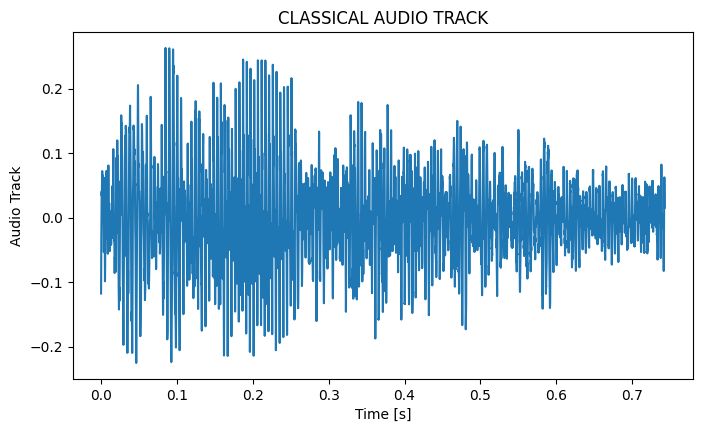

CLASSICAL PLAYER


STFT
transform.shape = (67, 1025)
transform.size = 68675
transform element = (-0.2424904853105545+0.1702343374490738j)


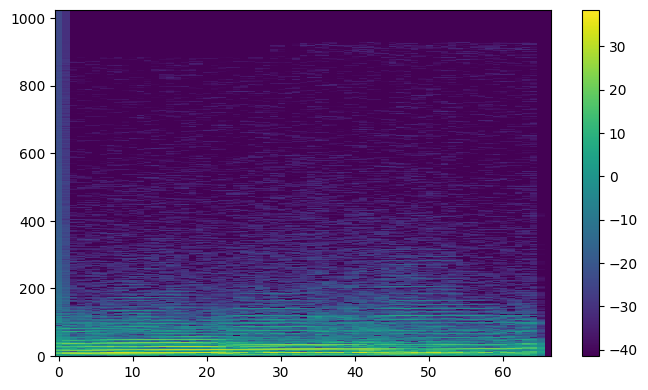

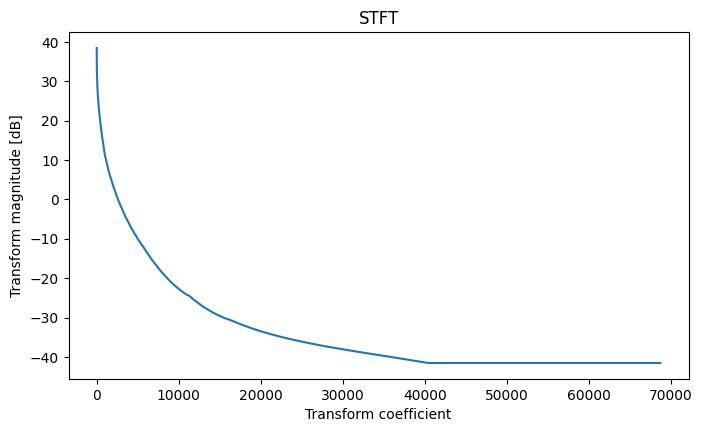

INVERSE STFT - CLASSICAL


INVERSE STFT - CLASSICAL - TOP K
Reconstructing from 1/8.00 of the samples: k = 8584


MELS
transform.shape = (67, 128)
transform.size = 8576
transform element = 0.017749905586242676


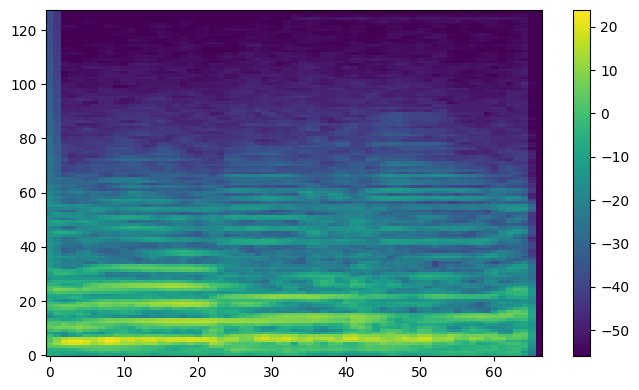

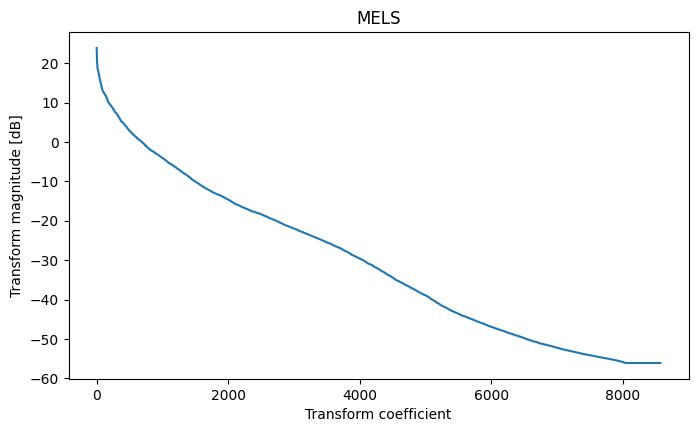

INVERSE MELS - CLASSICAL


INVERSE MELS - CLASSICAL - TOP K
Reconstructing from 1/8.00 of the samples: k = 1072


MFCC
transform.shape = (67, 128)
transform.size = 8576
transform element = -5.590126037597656


/var/tmp/ipykernel_29013/204460361.py:36: RuntimeWarning: divide by zero encountered in log10
  fn = lambda x: 20*np.log10(np.abs(x))


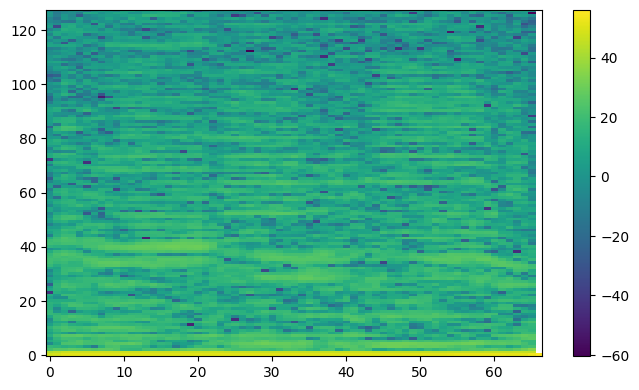

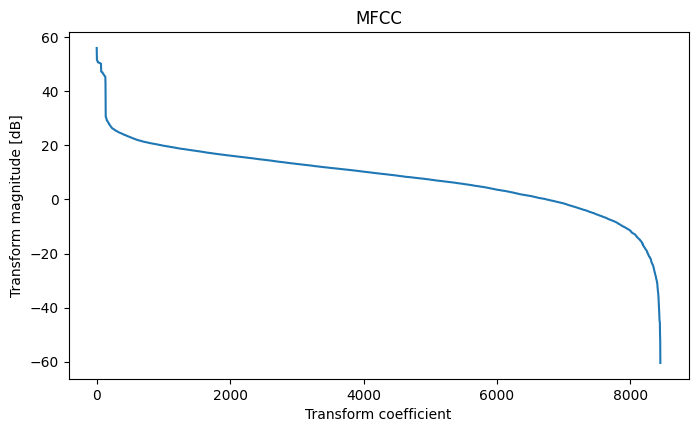

INVERSE MFCC - CLASSICAL


INVERSE MFCC - CLASSICAL - TOP K
Reconstructing from 1/8.00 of the samples: k = 1072


JAZZ
audio_file = '01--Dee_Yan-Key-pleasant_anticipation_56.wav'
len(audio) = 32768


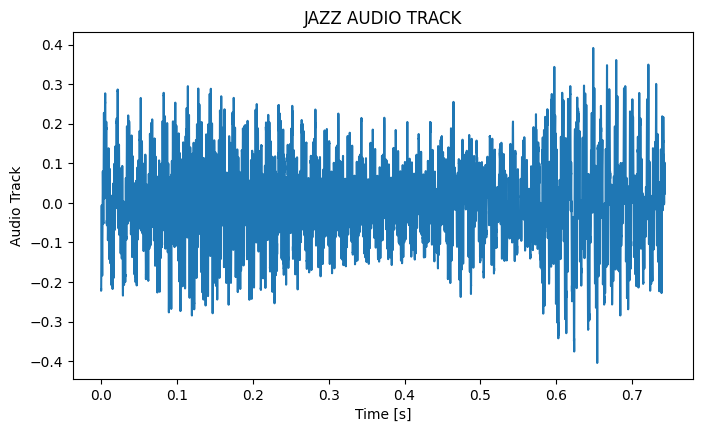

JAZZ PLAYER


STFT
transform.shape = (67, 1025)
transform.size = 68675
transform element = (0.009500819258391857-0.0027832931373268366j)


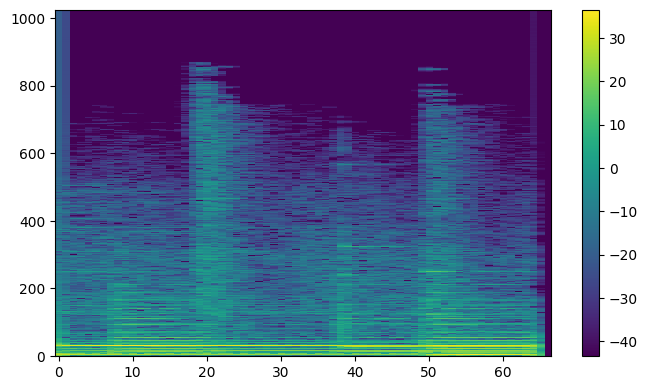

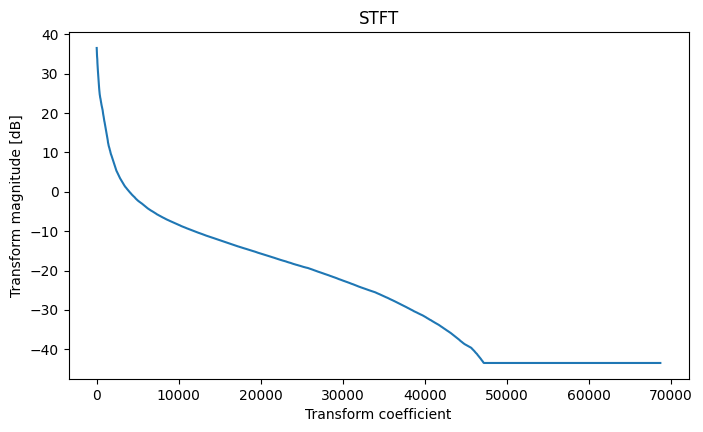

INVERSE STFT - JAZZ


INVERSE STFT - JAZZ - TOP K
Reconstructing from 1/8.00 of the samples: k = 8584


MELS
transform.shape = (67, 128)
transform.size = 8576
transform element = 2.7794785499572754


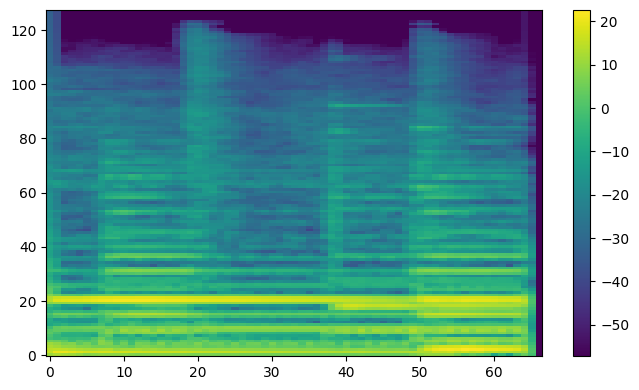

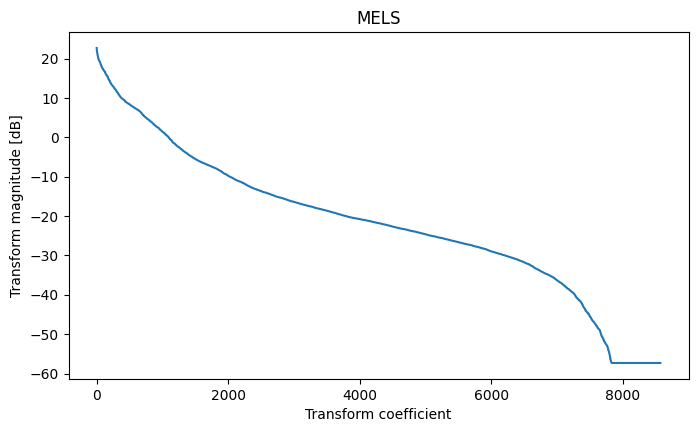

INVERSE MELS - JAZZ


INVERSE MELS - JAZZ - TOP K
Reconstructing from 1/8.00 of the samples: k = 1072


MFCC
transform.shape = (67, 128)
transform.size = 8576
transform element = -3.401686429977417


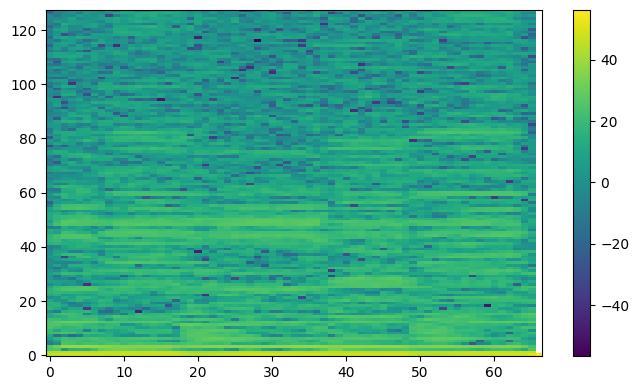

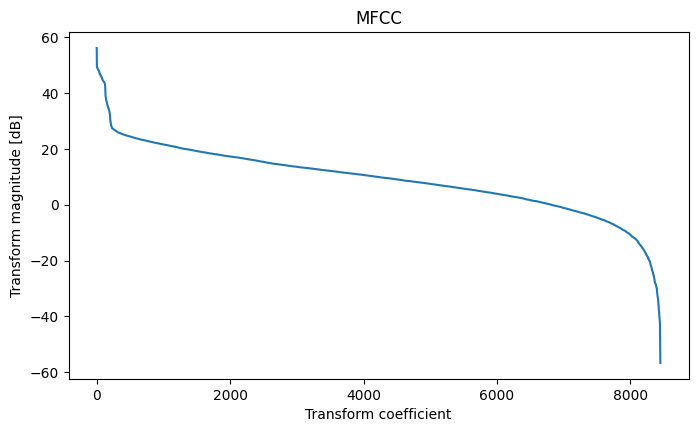

INVERSE MFCC - JAZZ


INVERSE MFCC - JAZZ - TOP K
Reconstructing from 1/8.00 of the samples: k = 1072


In [17]:
# Explore transform spaces for all genres
for genre_label, genre_path in zip(genre_labels, genre_paths):
    print(genre_label)

    # Pick a random audio track
    audio_file = np.random.choice(os.listdir(genre_path))
    audio_path = os.path.join(genre_path, audio_file)
    audio = read_audio(audio_path)
    time = np.linspace(0, len(audio)/default_sample_rate, len(audio))
    print(f"{audio_file = }")
    print(f"{len(audio) = }")

    # Time domain plot
    fig, ax = make_figax()
    ax.plot(time, audio)
    ax.set_xlabel("Time [s]")
    ax.set_ylabel("Audio Track")
    ax.set_title(f"{genre_label} AUDIO TRACK")
    plt.show()

    # Play audio
    print(f"{genre_label} PLAYER")
    player = play_audio(audio)

    # Transform to feature spaces and make plots
    for transform_label, transform_transform, transform_inverse_transform in zip(transform_labels, transform_transforms, transform_inverse_transforms):
        print(transform_label)

        # Compute transform
        transform = transform_transform(audio)
        print(f"{transform.shape = }")
        print(f"{transform.size = }")
        print(f"transform element = {np.random.choice(transform.reshape(-1))}")

        # Plot Transform in 2D
        fn = lambda x: 20*np.log10(np.abs(x))
        if transform_label == "STFT":
            fn = lambda x: lb.amplitude_to_db(np.abs(x))
        elif transform_label == "MELS":
            fn = lb.power_to_db
        fig, ax = plot_spectral_feature(transform, fn=fn)
        plt.show()

        # Plot transform coefficient roloff
        transform_fn = fn(transform)
        transform_magnitudes = np.sort(transform_fn.reshape(-1))[::-1]
        fig, ax = make_figax()
        ax.plot(transform_magnitudes)
        ax.set_xlabel("Transform coefficient")
        ax.set_ylabel("Transform magnitude [dB]")
        ax.set_title(transform_label)
        plt.show()

        # Transform reconstruct & play
        print(f"INVERSE {transform_label} - {genre_label}")
        inverse = transform_inverse_transform(transform)
        play_audio(inverse)

        # Transform reconstruct from top k & play
        print(f"INVERSE {transform_label} - {genre_label} - TOP K")
        fraction = 1/8
        k = int(transform.size * fraction)
        print(f"Reconstructing from 1/{1/fraction:.2f} of the samples: {k = }")
        transform[transform_fn <= transform_magnitudes[k]] = 0.
        inverse = transform_inverse_transform(transform)
        play_audio(inverse)

## Single Style Autoencoders

### Single Style Feature Extraction

In [8]:
# Choose dataset
cut_audio_path = cut_classical_path
cut_audio_files = os.listdir(cut_audio_path)

# Make a random selection of a fixed number of samples
n_samples = 2500
n_samples = min(n_samples, len(cut_audio_files))
print(f"{n_samples = }")
sample_files = np.random.choice(cut_audio_files, size=n_samples, replace=False)

n_samples = 2500


In [9]:
# Load audio and compute feature transforms
sample_features = [None] * len(sample_files)
expected_shape = None
for i, sample_file in enumerate(sample_files):
  sample_audio = read_audio(os.path.join(cut_audio_path, sample_file))
  sample_feature = compute_mels(sample_audio)

  # Make sure that feature shape matches expectation
  if expected_shape is None:
    expected_shape = sample_feature.shape
  assert sample_feature.shape == expected_shape, f"Audio file {sample_file} results in unexpected feature shape ({sample_feature.shape} != {expected_shape})"

  # Save feature
  sample_features[i] = sample_feature

  # Print progress
  sys.stdout.write('\r')
  sys.stdout.write(f"{(i+1) / n_samples * 100:.2f} %")
  sys.stdout.flush()
print()

# Convert to numpy array
sample_features = np.array(sample_features)

# Reshape features to vectors
feature_shape = sample_features[0].shape
feature_size = sample_features[0].size

print(f"{feature_shape = }")
print(f"{feature_size = }")

100.00 %
feature_shape = (67, 256)
feature_size = 17152


In [10]:
test_fraction = 0.1
raw_train_features, raw_test_features = train_test_split(sample_features, test_size=test_fraction)

print(f"{raw_train_features.shape = }")
print(f"{raw_test_features.shape = }")

raw_train_features.shape = (2250, 67, 256)
raw_test_features.shape = (250, 67, 256)


In [11]:
# Feature preprocessing
def preprocess_features(X_train_raw, X_test_raw, epsilon=1e-3):
  # Rescale by standard deviation
  std_dev = np.std(X_train_raw)
  X_train_p = X_train_raw / std_dev
  X_test_p = X_test_raw / std_dev

  # Rescale by logarithm
  X_train_p = np.log10(1 + X_train_p)
  X_test_p = np.log10(1 + X_test_p)

  # Frequency scaling
  frequency_weights = np.std(X_train_p, axis=(0,1)).reshape(1, 1, -1) + epsilon
  X_train = X_train_p / frequency_weights
  X_test = X_test_p / frequency_weights

  return X_train, X_test, std_dev, frequency_weights

def postprocess_features(X, std_dev, frequency_weights):
  # Apply frequency scaling
  X_p = X * frequency_weights

  # Apply exponential
  X_p = 10**X - 1

  # Rescale by std dev
  X_raw = X * std_dev

  return X_raw

In [12]:
train_features, test_features, std_dev, frequency_weights = preprocess_features(raw_train_features, raw_test_features)

std_dev = 19.009861


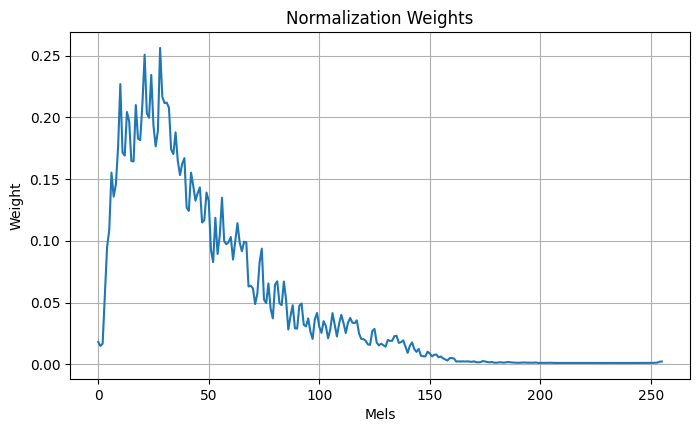

In [13]:
print(f"{std_dev = }")

fig, ax = plt.subplots(figsize=(8, 4.5))
ax.plot(frequency_weights.reshape(-1))
ax.set_xlabel("Mels")
ax.set_ylabel("Weight")
ax.set_title("Normalization Weights")
ax.grid()
plt.show()

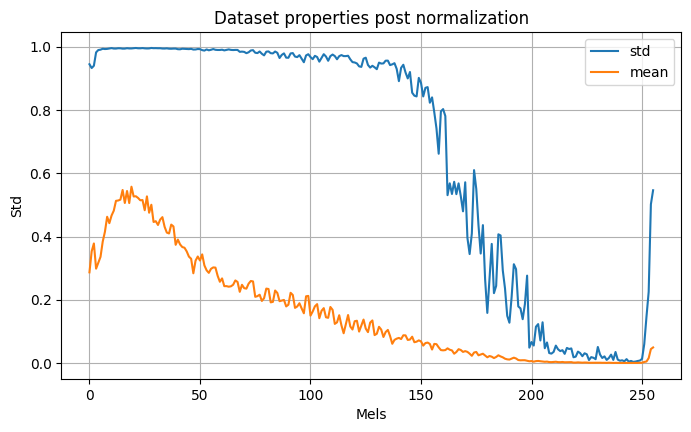

In [14]:
normalized_std = np.std(train_features, axis=(0, 1))
normalized_mean = np.mean(train_features, axis=(0,1))
normalized_max = np.max(train_features, axis=(0,1))
fig, ax = plt.subplots(figsize=(8, 4.5))
ax.plot(normalized_std, color="tab:blue", label="std")
ax.plot(normalized_mean, color="tab:orange", label="mean")
# ax.plot(normalized_max, color="tab:green", label="max")
ax.set_xlabel("Mels")
ax.set_ylabel("Std")
ax.set_title("Dataset properties post normalization")
ax.legend()
ax.grid()
plt.show()

### Single Style Autencoder Testing

In [15]:
nop = lambda x: x

def test_autoencoder(autoencoder, test_set = test_features, plot_transforms = True, plot_raw_transforms = True, plot_waveforms = True):
  # Pick sample at random
  print("Picking Sample")
  choice = np.random.choice(len(test_set))
  x = test_set[choice]

  # Autencoder
  print("Autencoding")
  x_hat = np.array(autoencoder(x.reshape((1, *x.shape))))

  if plot_transforms:
    print("Plotting transforms")
    fig, ax = plot_spectral_feature(x, fn=nop)
    ax.set_title("Original Preprocessed Spectrum")
    fig, ax = plot_spectral_feature(x_hat, fn=nop)
    ax.set_title("Reconstructed Preprocessed Spectrum")
    plt.show()

  # Postprocess
  print("Postprocessing")
  x_raw = postprocess_features(x.reshape((1, *x.shape)), std_dev, frequency_weights)[0]
  x_raw_hat = postprocess_features(x_hat.reshape((1, *x.shape)), std_dev, frequency_weights)[0]

  if plot_raw_transforms:
    print("Plotting transforms")
    fig, ax = plot_spectral_feature(x_raw)
    ax.set_title("Original Raw Spectrum")
    fig, ax = plot_spectral_feature(x_raw_hat)
    ax.set_title("Reconstructed Raw Spectrum")
    plt.show()

  # Reconstruct Audio
  print("Reconstructing Audio")
  s = compute_imels(x_raw)
  s_hat = compute_imels(x_raw_hat)

  if plot_waveforms:
    fig, ax = plot_audio(s)
    ax.set_title("Original Waveform")
    fig, ax = plot_audio(s_hat)
    ax.set_title("Reconstructed Waveform")
    plt.show()

  # Play audio
  print("Original Audio")
  player = play_audio(s)
  print("Reconstructed Audio")
  player = play_audio(s_hat)
  print()

In [16]:
def free_memory(autoencoder):
  krs.backend.clear_session()
  del autoencoder.encoder
  del autoencoder.decoder
  del autoencoder
  krs.backend.clear_session()

In [17]:
models_dir = "models"
models_path = os.path.join(data_path, models_dir)
os.makedirs(models_path, exist_ok = True)

def save_autoencoder(autoencoder, params, history, name):
    # Define and make directory
    autoencoder_path = os.path.join(models_path, name)
    os.makedirs(autoencoder_path, exist_ok = True)
    
    # Save parameters
    with open(os.path.join(autoencoder_path, "params.json"), "w") as params_file:
        json.dump(params, params_file)
        
    # Save history
    with open(os.path.join(autoencoder_path, "history.json"), "w") as history_file:
        if not isinstance(history, dict):
            history = history.history
        json.dump(history, history_file)
    
    # Save model
    autoencoder.save(os.path.join(autoencoder_path, "model.keras"))

def load_autoencoder(name, load_model = True):
    # Define path
    autoencoder_path = os.path.join(models_path, name)
    
    # Load parameters
    with open(os.path.join(autoencoder_path, "params.json"), "r") as params_file:
        params = json.load(params_file)
    
    # Load history
    with open(os.path.join(autoencoder_path, "history.json"), "r") as history_file:
        history = json.load(history_file)
    
    # Load model
    autoencoder = None
    if load_model:
        autoencoder = krs.models.load_model(os.path.join(autoencoder_path, "model.keras"))
    
    return autoencoder, params, history

### Frequency-Dense Single Style Autoencoder

In [18]:
@krs.saving.register_keras_serializable()
class DenseFrequencyAutoEncoder(krs.models.Model):
  def __init__(self, feature_shape, latent_factor, n_layers, filter_size=3, regularization=1e-5):
    super().__init__()

    # Save variables
    self.feature_shape = feature_shape
    self.n_time, self.n_channels = self.feature_shape
    self.latent_factor = latent_factor
    self.latent_channels = round(self.n_channels / self.latent_factor)
    self.n_layers = n_layers
    self.filter_size = filter_size

    # Figure out hidden layer sizes
    layer_channels = np.logspace(np.log10(self.latent_channels), np.log10(self.n_channels), self.n_layers + 1, base=10, endpoint=True)
    layer_channels = np.round(layer_channels).astype(int)
    print(f"Layer channels = {layer_channels[::-1]}")

    # Autoencoder = encoder + decoder
    self.encoder = krs.models.Sequential()
    self.decoder = krs.models.Sequential()

    # Add layers to autoencoders
    for layer in range(self.n_layers):
      # Add encoder layer
      encoder_input_channels = layer_channels[self.n_layers - layer]
      encoder_channels = layer_channels[self.n_layers - 1 - layer]
      self.encoder.add(
        krs.layers.Conv1D(
          encoder_channels,
          self.filter_size,
          activation="relu",
          padding="same",
          use_bias=True,
          input_shape=(None, encoder_input_channels),
          kernel_regularizer=krs.regularizers.L2(regularization),
          bias_regularizer=krs.regularizers.L2(regularization),
        )
      )

      # Add decoder layer
      decoder_input_channels = layer_channels[layer]
      decoder_channels = layer_channels[1 + layer]
      self.decoder.add(
        krs.layers.Conv1DTranspose(
          decoder_channels,
          self.filter_size,
          activation="relu",
          padding="same",
          use_bias=True,
          input_shape=(None, decoder_input_channels),
          kernel_regularizer=krs.regularizers.L2(regularization),
          bias_regularizer=krs.regularizers.L2(regularization),
        )
      )

  def call(self, x):
    h = self.encoder(x)
    x_hat = self.decoder(h)
    return x_hat

In [21]:
default_params = {
    "feature_shape": train_features.shape[1:],
    "n_layers": 3,
    "latent_factor": 8,
    "filter_size": 5,
    "regularization": 0.0,
}

def construct_model(params = {}):
    feature_shape = params.get("feature_shape", default_params["feature_shape"])
    n_layers = params.get("n_layers", default_params["n_layers"])
    latent_factor = params.get("latent_factor", default_params["latent_factor"])
    filter_size = params.get("filter_size", default_params["filter_size"])
    regularization = params.get("regularization", default_params["regularization"])

    autoencoder = DenseFrequencyAutoEncoder(feature_shape, latent_factor, n_layers, filter_size, regularization)
    
    return autoencoder

In [25]:
autoencoder = construct_model()
autoencoder.compile(optimizer="adam", loss=mse_loss)
history = autoencoder.fit(train_features, train_features, epochs=50, shuffle=True, validation_data=(test_features, test_features), verbose=1)

Layer channels = [256 128  64  32]
Epoch 1/50
71/71 [==============================] - 3s 12ms/step - loss: 0.5043 - val_loss: 0.2850
Epoch 2/50
71/71 [==============================] - 0s 6ms/step - loss: 0.4046 - val_loss: 0.2552
Epoch 3/50
71/71 [==============================] - 0s 6ms/step - loss: 0.3604 - val_loss: 0.2329
Epoch 4/50
71/71 [==============================] - 0s 6ms/step - loss: 0.3439 - val_loss: 0.2187
Epoch 5/50
71/71 [==============================] - 0s 6ms/step - loss: 0.3241 - val_loss: 0.2130
Epoch 6/50
71/71 [==============================] - 0s 6ms/step - loss: 0.3250 - val_loss: 0.2066
Epoch 7/50
71/71 [==============================] - 0s 6ms/step - loss: 0.3094 - val_loss: 0.2077
Epoch 8/50
71/71 [==============================] - 0s 6ms/step - loss: 0.3040 - val_loss: 0.2102
Epoch 9/50
71/71 [==============================] - 0s 6ms/step - loss: 0.3047 - val_loss: 0.2053
Epoch 10/50
71/71 [==============================] - 0s 6ms/step - loss: 0.2899 - 

In [26]:
save_autoencoder(autoencoder, default_params, history, "frequencydense_default")

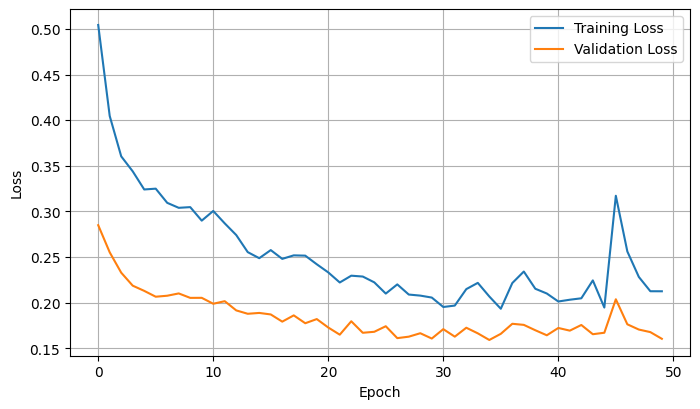

In [27]:
fig, ax = plot_autoencoder_history(history)
plt.show()

Picking Sample
Autencoding
Postprocessing
Plotting transforms


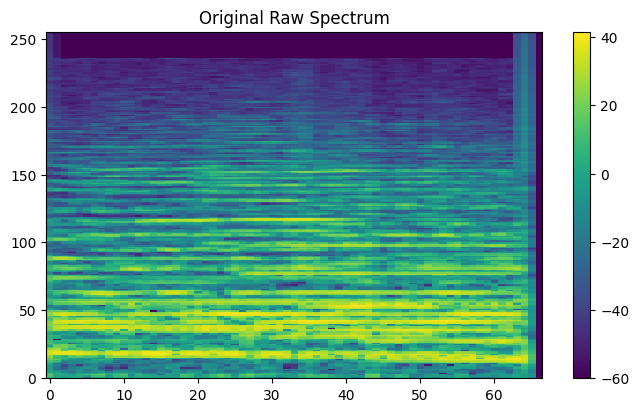

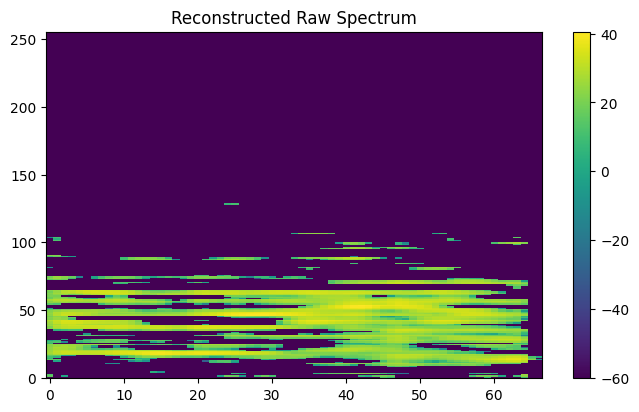

Reconstructing Audio
Original Audio


Reconstructed Audio


In [28]:
test_autoencoder(autoencoder, plot_transforms=False, plot_raw_transforms=True, plot_waveforms=False)

In [29]:
free_memory(autoencoder)

In [30]:
# Find best performing model for each number of level of compression
latent_factors = [2, 4, 8, 16, 32]
base_name = "frequencydense"
for latent_factor in latent_factors[::-1]:
    print(f"Looking for best parameters for compression with factor {latent_factor}")
    latent_name = base_name + f"_latent{latent_factor}"
    
    # Sweeping nr of layers
    n_layerss = [1, 2, 3, 4, 5]
    val_losses = [np.inf] * len(n_layerss)
    for i, n_layers in enumerate(n_layerss):
        print(f"Training model with {n_layers} layers")
        layers_name = latent_name + f"_layers{n_layers}"
        name = layers_name
        
        # Load from disk if exists
        if os.path.exists(os.path.join(models_path, name)):
            print("Already trained, loading from disk")
            _, _, history = load_autoencoder(name, load_model=False)
            val_losses[i] = history["val_loss"][-1]
            continue
        
        # Construct params
        params = default_params.copy()
        params["latent_factor"] = latent_factor
        params["n_layers"] = n_layers
        
        # Construct and train model
        autoencoder = construct_model(params)
        autoencoder.compile(optimizer="adam", loss=mse_loss)
        history = autoencoder.fit(train_features, train_features, epochs=50, shuffle=True, validation_data=(test_features, test_features), verbose=0)
        
        # Save model
        save_autoencoder(autoencoder, params, history, name)
        free_memory(autoencoder)
        
        # Check validation loss
        val_loss = history.history["val_loss"]
        val_losses[i] = val_loss[-1]
    
    # Determine optimal nr of layers
    i_optimal = np.argmin(val_losses)
    n_layers_optimal = n_layerss[i_optimal]
    val_loss_optimal = val_losses[i_optimal]
    print(f"Optimal nr of layers = {n_layers_optimal}, val_loss = {val_loss_optimal}")
    
    # Sweeping filter size
    filter_sizes = [1, 2, 3, 4, 5, 6]
    val_losses = [np.inf] * len(filter_sizes)
    for i, filter_size in enumerate(filter_sizes):
        print(f"Training model with {n_layers_optimal} layers and filter size = {filter_size}")
        layers_name = latent_name + f"_layers{n_layers_optimal}"
        filters_name = layers_name + f"_filter{filter_size}"
        name = filters_name
        
        # Load from disk if exists
        if os.path.exists(os.path.join(models_path, name)):
            print("Already trained, loading from disk")
            _, _, history = load_autoencoder(name, load_model=False)
            val_losses[i] = history["val_loss"][-1]
            continue
        
        # Construct params
        params = default_params.copy()
        params["latent_factor"] = latent_factor
        params["n_layers"] = n_layers_optimal
        params["filter_size"] = filter_size
        
        # Construct and train model
        autoencoder = construct_model(params)
        autoencoder.compile(optimizer="adam", loss=mse_loss)
        history = autoencoder.fit(train_features, train_features, epochs=50, shuffle=True, validation_data=(test_features, test_features), verbose=0)
        
        # Save model
        save_autoencoder(autoencoder, params, history, name)
        free_memory(autoencoder)
        
        # Check validation loss
        val_loss = history.history["val_loss"]
        val_losses[i] = val_loss[-1]
    
    # Determine optimal filter size
    i_optimal = np.argmin(val_losses)
    filter_size_optimal = filter_sizes[i_optimal]
    val_loss_optimal = val_losses[i_optimal]
    print(f"Optimal filter size = {filter_size_optimal}, val_loss = {val_loss_optimal}")
    
    # Sweep regularization
    regularizations = [1e-10, 1e-9, 1e-8, 1e-7, 1e-6]
    val_losses = [np.inf] * len(regularizations)
    for i, regularization in enumerate(regularizations):
        print(f"Training model with {n_layers_optimal} layers and filter size = {filter_size_optimal} and regularization = {regularization}")
        layers_name = latent_name + f"_layers{n_layers_optimal}"
        filters_name = layers_name + f"_filter{filter_size_optimal}"
        regularization_name = filters_name + f"_reg{int(np.round(np.log10(regularization)))}"
        name = regularization_name
        
        # Load from disk if exists
        if os.path.exists(os.path.join(models_path, name)):
            print("Already trained, loading from disk")
            _, _, history = load_autoencoder(name, load_model=False)
            val_losses[i] = history["val_loss"][-1]
            continue
        
        # Construct params
        params = default_params.copy()
        params["latent_factor"] = latent_factor
        params["n_layers"] = n_layers_optimal
        params["filter_size"] = filter_size_optimal
        params["regularization"] = regularization
        
        # Construct and train model
        autoencoder = construct_model(params)
        autoencoder.compile(optimizer="adam", loss=mse_loss)
        history = autoencoder.fit(train_features, train_features, epochs=50, shuffle=True, validation_data=(test_features, test_features), verbose=0)
        
        # Save model
        save_autoencoder(autoencoder, params, history, name)
        free_memory(autoencoder)
        
        # Check validation loss
        val_loss = history.history["val_loss"]
        val_losses[i] = val_loss[-1]
    
    # Determine optimal filter size
    i_optimal = np.argmin(val_losses)
    regularization_optimal = regularizations[i_optimal]
    val_loss_optimal = val_losses[i_optimal]
    print(f"Optimal regularization = {regularization_optimal}, val_loss = {val_loss_optimal}")
        
    
    # Load optimal autoencoder & save under different name
    name = latent_name + f"_layers{n_layers_optimal}_filter{filter_size_optimal}_reg{int(np.round(np.log10(regularization_optimal)))}"
    name_optimal = latent_name + "_optimal"
    autoencoder, params, history = load_autoencoder(name)
    save_autoencoder(autoencoder, params, history, name_optimal)    

Looking for best parameters for compression with factor 32
Training model with 1 layers
Layer channels = [256   8]
Training model with 2 layers
Layer channels = [256  45   8]
Training model with 3 layers
Layer channels = [256  81  25   8]
Training model with 4 layers
Layer channels = [256 108  45  19   8]
Training model with 5 layers
Layer channels = [256 128  64  32  16   8]
Optimal nr of layers = 2, val_loss = 0.19923444092273712
Training model with 2 layers and filter size = 1
Layer channels = [256  45   8]
Training model with 2 layers and filter size = 2
Layer channels = [256  45   8]
Training model with 2 layers and filter size = 3
Layer channels = [256  45   8]
Training model with 2 layers and filter size = 4
Layer channels = [256  45   8]
Training model with 2 layers and filter size = 5
Layer channels = [256  45   8]
Training model with 2 layers and filter size = 6
Layer channels = [256  45   8]
Optimal filter size = 2, val_loss = 0.1953810602426529
Training model with 2 layers 

2023-10-23 22:12:55.040032: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 7.47GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2023-10-23 22:12:55.577587: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 7.26GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2023-10-23 22:12:55.579744: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 7.26GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2023-10-23 22:12:55.647366: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU

Training model with 4 layers
Layer channels = [256 215 181 152 128]
Training model with 5 layers
Layer channels = [256 223 194 169 147 128]
Optimal nr of layers = 1, val_loss = 0.07279384136199951
Training model with 1 layers and filter size = 1
Layer channels = [256 128]
Training model with 1 layers and filter size = 2
Layer channels = [256 128]
Training model with 1 layers and filter size = 3
Layer channels = [256 128]
Training model with 1 layers and filter size = 4
Layer channels = [256 128]
Training model with 1 layers and filter size = 5
Layer channels = [256 128]
Training model with 1 layers and filter size = 6
Layer channels = [256 128]
Optimal filter size = 1, val_loss = 0.025263873860239983
Training model with 1 layers and filter size = 1 and regularization = 1e-10
Layer channels = [256 128]
Training model with 1 layers and filter size = 1 and regularization = 1e-09
Layer channels = [256 128]
Training model with 1 layers and filter size = 1 and regularization = 1e-08
Layer ch

Evaluating optimal model with compression 2


2023-10-24 13:02:16.886756: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:894] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-10-24 13:02:16.890188: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:894] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-10-24 13:02:16.892692: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:894] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

Layer channels = [256 128]
Parameters:
	- feature_shape: [67, 256]
	- n_layers: 1
	- latent_factor: 2
	- filter_size: 1
	- regularization: 1e-09

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, None, 128)         32896     
                                                                 
Total params: 32896 (128.50 KB)
Trainable params: 32896 (128.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_transpose (Conv1DTr  (None, None, 256)         33024     
 anspose)                                                        
                                                                 
Total params: 33024 (129.00 KB)
Trainable params

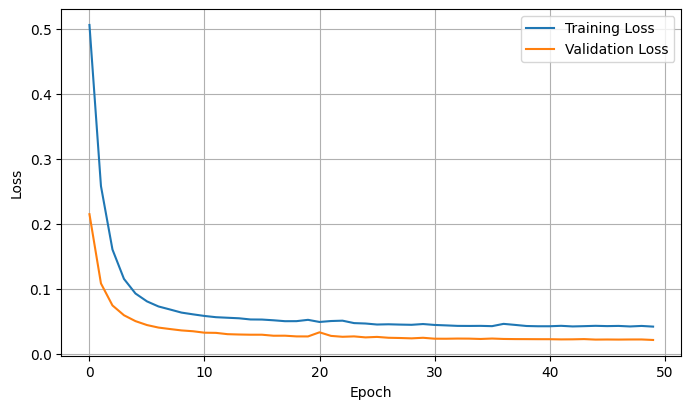

Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio



Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio



Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio



Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio



Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio



Evaluating optimal model with compression 4
Layer channels = [256  64]
Parameters:
	- feature_shape: [67, 256]
	- n_layers: 1
	- latent_factor: 4
	- filter_size: 1
	- regularization: 1e-10

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, None, 64)          16448     
                                                                 
Total params: 16448 (64.25 KB)
Trainable params: 16448 (64.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_transpose (Conv1DTr  (None, None, 256)         16640     
 anspose)                                                        
                                                                 
Total

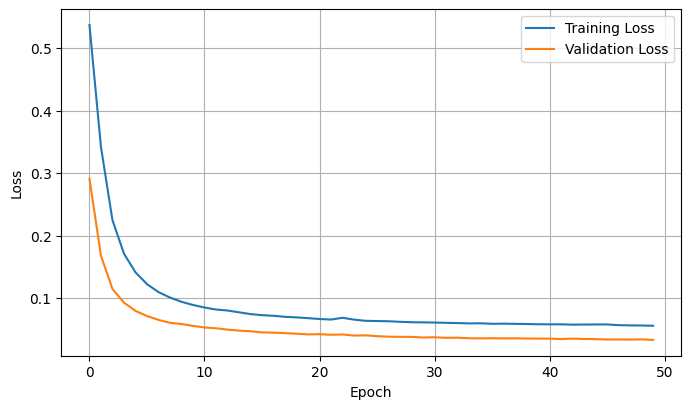

Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio



Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio



Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio



Picking Sample
Autencoding
Postprocessing
Reconstructing Audio


/var/tmp/ipykernel_3083/2019872768.py:24: RuntimeWarning: overflow encountered in power
  X_p = 10**X - 1


Original Audio


Reconstructed Audio



Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio



Evaluating optimal model with compression 8
Layer channels = [256  32]
Parameters:
	- feature_shape: [67, 256]
	- n_layers: 1
	- latent_factor: 8
	- filter_size: 1
	- regularization: 1e-06

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, None, 32)          8224      
                                                                 
Total params: 8224 (32.12 KB)
Trainable params: 8224 (32.12 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_transpose (Conv1DTr  (None, None, 256)         8448      
 anspose)                                                        
                                                                 
Total p

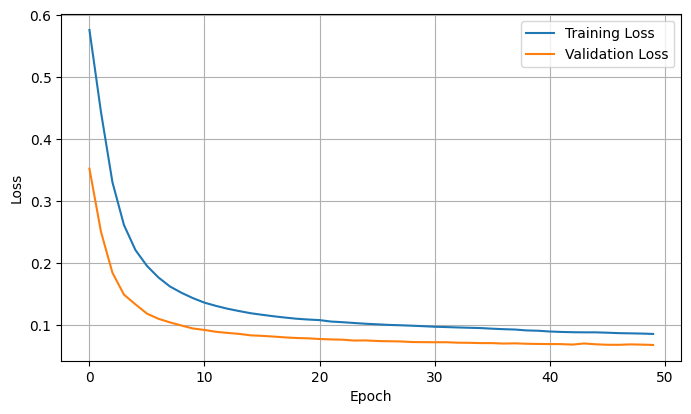

Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio



Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio



Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio



Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio



Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio



Evaluating optimal model with compression 16
Layer channels = [256  64  16]
Parameters:
	- feature_shape: [67, 256]
	- n_layers: 2
	- latent_factor: 16
	- filter_size: 1
	- regularization: 1e-07

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, None, 64)          16448     
                                                                 
 conv1d_1 (Conv1D)           (None, None, 16)          1040      
                                                                 
Total params: 17488 (68.31 KB)
Trainable params: 17488 (68.31 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_transpose (Conv1DTr  (None, None, 64)          1088      

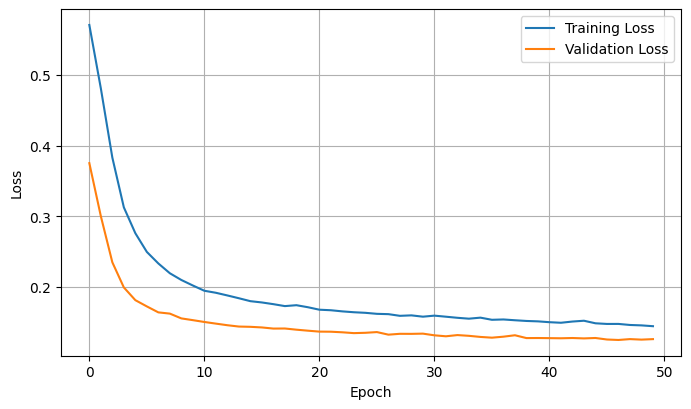

Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio



Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio



Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio



Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio



Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio



Evaluating optimal model with compression 32
Layer channels = [256  45   8]
Parameters:
	- feature_shape: [67, 256]
	- n_layers: 2
	- latent_factor: 32
	- filter_size: 2
	- regularization: 1e-09

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, None, 45)          23085     
                                                                 
 conv1d_1 (Conv1D)           (None, None, 8)           728       
                                                                 
Total params: 23813 (93.02 KB)
Trainable params: 23813 (93.02 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_transpose (Conv1DTr  (None, None, 45)          765       

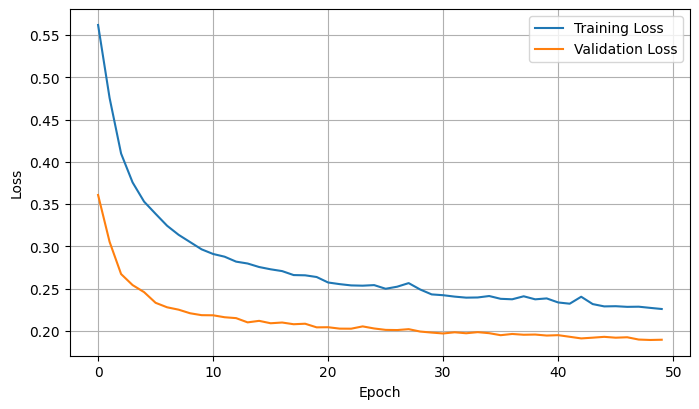

Picking Sample
Autencoding


2023-10-24 13:02:48.505547: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:442] Loaded cuDNN version 8900


Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio



Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio



Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio



Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio



Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio


In [22]:
# Test best performing models
latent_factors = [2, 4, 8, 16, 32]
base_name = "frequencydense"
best_params_fd = {}
best_losses_fd = {}
for latent_factor in latent_factors:
    print(f"Evaluating optimal model with compression {latent_factor}")
    latent_name = base_name + f"_latent{latent_factor}"
    name = latent_name + "_optimal"
    
    # Print parameters
    autoencoder, params, history = load_autoencoder(name)
    print("Parameters:")
    for key, value in params.items():
        print(f"\t- {key}: {value}")
    print()
        
    # Print model summary
    autoencoder.encoder.summary()
    autoencoder.decoder.summary()
    
    # Plot history
    fig, ax = plot_autoencoder_history(history)
    plt.show()
    
    # Save parameters and losses
    for key, value in params.items():
        best_params_fd[key] = [*best_params_fd.get(key, []), value]
    for key, loss in history.items():
        best_losses_fd[key] = [*best_losses_fd.get(key, []), loss[-1]]
    
    # Test autoencoder on samples
    n_tests = 5
    for test in range(n_tests):
        test_autoencoder(autoencoder, plot_transforms=False, plot_raw_transforms=False, plot_waveforms=False)
        
    free_memory(autoencoder)
    

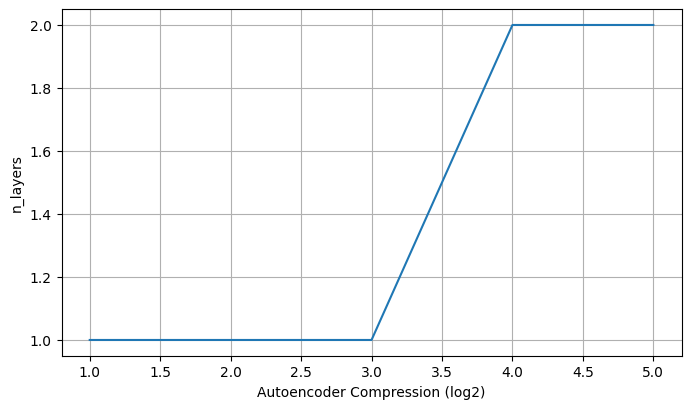

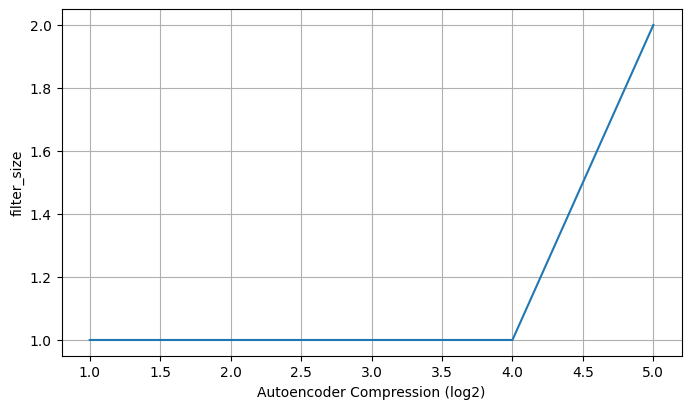

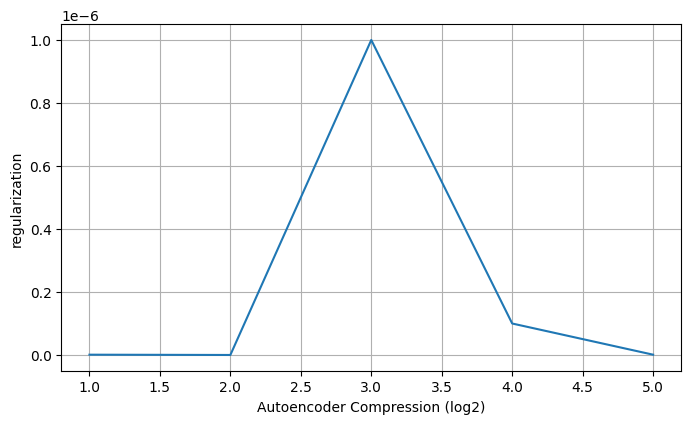

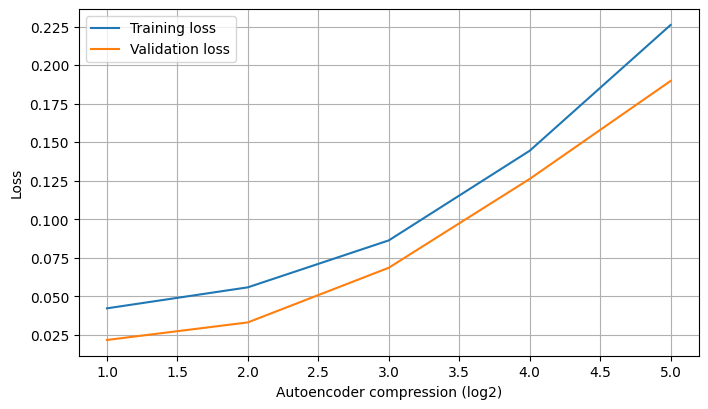

In [33]:
# Make loss & parameter plots in function of network compression
for param, values in best_params_fd.items():
    if param in ["feature_shape", "latent_factor"]:
        continue
    
    fig, ax = make_figax()
    ax.plot(np.log2(latent_factors), values)
    ax.set_xlabel("Autoencoder Compression (log2)")
    ax.set_ylabel(param)
    ax.grid()
    plt.show()
    
fig, ax = make_figax()
train_loss = best_losses_fd["loss"]
val_loss = best_losses_fd["val_loss"]
ax.plot(np.log2(latent_factors), train_loss, label="Training loss")
ax.plot(np.log2(latent_factors), val_loss, label="Validation loss")
ax.set_xlabel("Autoencoder compression (log2)")
ax.set_ylabel("Loss")
ax.legend()
ax.grid()
plt.show()

### Convolutional Single Style Autoencoder

In [18]:
@krs.saving.register_keras_serializable()
class ConvolutionalAutoEncoder(krs.models.Model):
    def __init__(self, feature_shape, latent_factor, n_layers, filter_width=3, filter_height=3, regularization=1e-5):
        super().__init__()

        # Save variables
        self.feature_shape = feature_shape
        self.filter_shape = (filter_width, filter_height)
        self.n_time, self.n_channels = self.feature_shape      
        self.latent_factor = latent_factor
        self.n_layers = n_layers
        self.latent_channels = int(4**(self.n_layers - 1) / self.latent_factor) # Each layer the width & height halve
        if self.latent_channels < 1:
            print("WARNING: The chosen compression is incompatible with the network topology")
            self.latent_channels = 1
            self.latent_factor = 4**(self.n_layers - 1)
            print(f"Using 1 latent channel, resulting in compression = {self.latent_factor}")
            assert False
        
        # Time dimension can be anything -- add padding where needed
        self.layer_paddings = np.zeros(n_layers - 1, dtype = bool)
        x = self.n_time
        for i in range(n_layers - 1):
            padding = x % 2
            self.layer_paddings[i] = padding == 1
            x = (x + padding) // 2
        print(f"Layer paddings = {self.layer_paddings}")        
        

        # Figure out hidden layer sizes
        layer_channels = np.logspace(np.log2(1), np.log2(self.latent_channels), self.n_layers + 1, base=2, endpoint = True)
        layer_channels = np.ceil(layer_channels).astype(int)
        print(f"Layer channels = {layer_channels[::-1]}")    

        # Autoencoder = encoder + decoder
        self.encoder = krs.models.Sequential()
        self.decoder = krs.models.Sequential()
        
        # Add channels dimension to spectrum
        self.encoder.add(
            krs.layers.Reshape(
                (self.n_time, self.n_channels, 1),
                input_shape=(self.n_time, self.n_channels)
            )
        )

        # Add layers to autoencoders
        for layer in range(self.n_layers):
            # Add encoder layer
            ## Convolution layer
            encoder_channels = layer_channels[layer + 1]
            self.encoder.add(
                krs.layers.Conv2D(
                    encoder_channels,
                    self.filter_shape,
                    padding="same",
                    activation="relu",
                    use_bias=True,
                    kernel_regularizer=krs.regularizers.L2(regularization),
                    bias_regularizer=krs.regularizers.L2(regularization),
                )
            )
            ## All except last encoder layer
            if layer < self.n_layers - 1:
                ## Padding if necessary
                add_padding = self.layer_paddings[layer]
                if add_padding:
                    self.encoder.add(
                        krs.layers.ZeroPadding2D(
                            padding=((0, 1),(0, 0))
                        )
                    )
                ## Mean pooling layer
                self.encoder.add(
                    krs.layers.AveragePooling2D(
                        pool_size=(2, 2),
                        strides=2,
                    )
                )
            
            # Add Decoder layer
            ## All except first decoder layer
            if layer > 0:
                ## Upsampling layer
                self.decoder.add(
                    krs.layers.UpSampling2D(
                        size=(2, 2),
                    )
                )
                ## Cropping if necessary
                do_cropping = self.layer_paddings[self.n_layers - 1 - layer]
                if do_cropping:
                    self.decoder.add(
                        krs.layers.Cropping2D(
                            cropping=((0, 1), (0, 0))
                        )
                    )
                
            ## Deconvolution layer
            decoder_channels = layer_channels[self.n_layers - layer - 1]
            self.decoder.add(
                krs.layers.Conv2DTranspose(
                    decoder_channels,
                    self.filter_shape,
                    padding="same",
                    activation="relu",
                    use_bias=True,
                    kernel_regularizer=krs.regularizers.L2(regularization),
                    bias_regularizer=krs.regularizers.L2(regularization),
                )
            )
            
        
        # Remove channels dimension from spectrum
        self.decoder.add(
            krs.layers.Reshape(
                (self.n_time, self.n_channels),
                input_shape=(self.n_time, self.n_channels, 1),
            )
        )

    def call(self, x):
        h = self.encoder(x)
        x_hat = self.decoder(h)
        return x_hat

In [19]:
default_params = {
    "feature_shape": train_features.shape[1:],
    "n_layers": 3,
    "latent_factor": 8,
    "filter_width": 5,
    "filter_height": 5,
    "regularization": 0.0,
}

def construct_model(params = {}):
    feature_shape = params.get("feature_shape", default_params["feature_shape"])
    n_layers = params.get("n_layers", default_params["n_layers"])
    latent_factor = params.get("latent_factor", default_params["latent_factor"])
    filter_width = params.get("filter_width", default_params["filter_width"])
    filter_height = params.get("filter_height", default_params["filter_height"])
    regularization = params.get("regularization", default_params["regularization"])

    autoencoder = ConvolutionalAutoEncoder(feature_shape, latent_factor, n_layers, filter_width, filter_height, regularization)
    
    return autoencoder

In [20]:
autoencoder = construct_model()
autoencoder.compile(optimizer="adam", loss=mse_loss)
history = autoencoder.fit(train_features, train_features, epochs=50, shuffle=True, validation_data=(test_features, test_features), verbose=1)

2023-10-24 16:24:58.054504: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:894] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-10-24 16:24:58.058108: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:894] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-10-24 16:24:58.060803: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:894] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

Layer paddings = [ True False]
Layer channels = [2 2 2 1]
Epoch 1/50


2023-10-24 16:25:01.866506: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:442] Loaded cuDNN version 8900
2023-10-24 16:25:03.655692: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x7fc22000f820 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2023-10-24 16:25:03.655741: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
2023-10-24 16:25:03.662033: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2023-10-24 16:25:03.770020: I ./tensorflow/compiler/jit/device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


71/71 [==============================] - 6s 15ms/step - loss: 0.5075 - val_loss: 0.3707
Epoch 2/50
71/71 [==============================] - 0s 6ms/step - loss: 0.3209 - val_loss: 0.2657
Epoch 3/50
71/71 [==============================] - 0s 6ms/step - loss: 0.2743 - val_loss: 0.2407
Epoch 4/50
71/71 [==============================] - 0s 6ms/step - loss: 0.2514 - val_loss: 0.2161
Epoch 5/50
71/71 [==============================] - 0s 6ms/step - loss: 0.2265 - val_loss: 0.1979
Epoch 6/50
71/71 [==============================] - 0s 6ms/step - loss: 0.2144 - val_loss: 0.1903
Epoch 7/50
71/71 [==============================] - 0s 6ms/step - loss: 0.2037 - val_loss: 0.1801
Epoch 8/50
71/71 [==============================] - 0s 6ms/step - loss: 0.1997 - val_loss: 0.1760
Epoch 9/50
71/71 [==============================] - 0s 6ms/step - loss: 0.1940 - val_loss: 0.1714
Epoch 10/50
71/71 [==============================] - 0s 6ms/step - loss: 0.1892 - val_loss: 0.1692
Epoch 11/50
71/71 [==========

In [21]:
base_name="convolutional"
save_autoencoder(autoencoder, default_params, history, f"{base_name}_default")

In [22]:
autoencoder.encoder.summary()
autoencoder.decoder.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape (Reshape)           (None, 67, 256, 1)        0         
                                                                 
 conv2d (Conv2D)             (None, 67, 256, 2)        52        
                                                                 
 zero_padding2d (ZeroPaddin  (None, 68, 256, 2)        0         
 g2D)                                                            
                                                                 
 average_pooling2d (Average  (None, 34, 128, 2)        0         
 Pooling2D)                                                      
                                                                 
 conv2d_1 (Conv2D)           (None, 34, 128, 2)        102       
                                                                 
 average_pooling2d_1 (Avera  (None, 17, 64, 2)         0

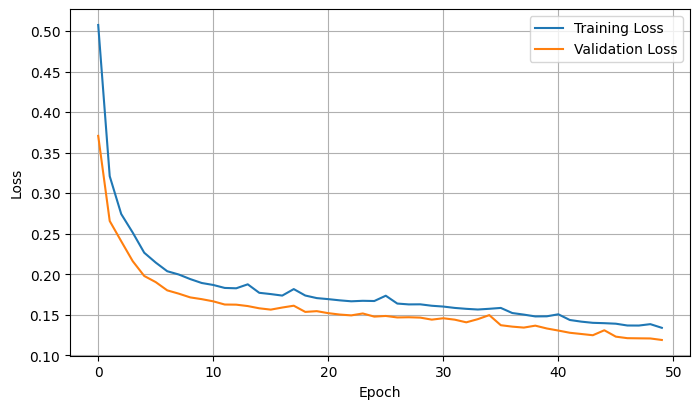

In [23]:
fig, ax = plot_autoencoder_history(history)
plt.show()

Picking Sample
Autencoding
Postprocessing
Plotting transforms


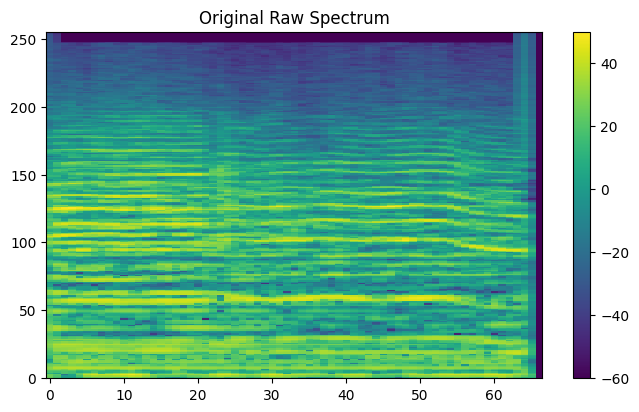

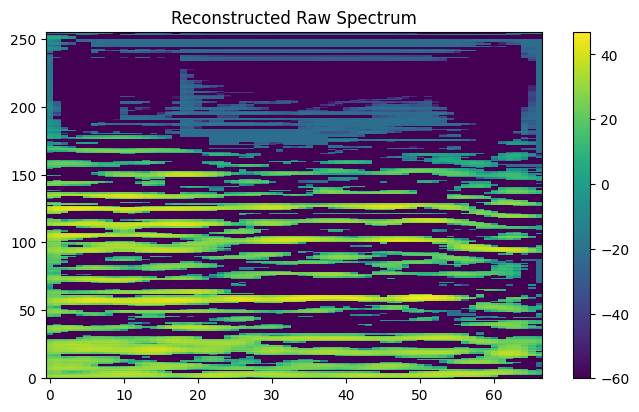

Reconstructing Audio
Original Audio


Reconstructed Audio


In [24]:
test_autoencoder(autoencoder, plot_transforms=False, plot_raw_transforms=True, plot_waveforms=False)

In [25]:
free_memory(autoencoder)

In [26]:
# Find best performing model for each number of level of compression
latent_factors = [2, 4, 8, 16, 32]
base_name = "convolutional"
for latent_factor in latent_factors[::-1]:
    print(f"Looking for best parameters for compression with factor {latent_factor}")
    latent_name = base_name + f"_latent{latent_factor}"
    
    # Sweeping nr of layers
    n_layerss = [1, 2, 3, 4, 5, 6]
    val_losses = [np.inf] * len(n_layerss)
    for i, n_layers in enumerate(n_layerss):
        print(f"Training model with {n_layers} layers")
        layers_name = latent_name + f"_layers{n_layers}"
        name = layers_name
        
        # Load from disk if exists
        if os.path.exists(os.path.join(models_path, name)):
            print("Already trained, loading from disk")
            _, _, history = load_autoencoder(name, load_model=False)
            val_losses[i] = history["val_loss"][-1]
            continue
        
        # Construct params
        params = default_params.copy()
        params["latent_factor"] = latent_factor
        params["n_layers"] = n_layers
        
        # Construct and train model
        try:
            autoencoder = construct_model(params)
        except:
            print("Configuration is not possible")
            continue
        autoencoder.compile(optimizer="adam", loss=mse_loss)
        history = autoencoder.fit(train_features, train_features, epochs=50, shuffle=True, validation_data=(test_features, test_features), verbose=0)
        
        # Save model
        save_autoencoder(autoencoder, params, history, name)
        free_memory(autoencoder)
        
        # Check validation loss
        val_loss = history.history["val_loss"]
        val_losses[i] = val_loss[-1]
    
    # Determine optimal nr of layers
    i_optimal = np.argmin(val_losses)
    n_layers_optimal = n_layerss[i_optimal]
    val_loss_optimal = val_losses[i_optimal]
    print(f"Optimal nr of layers = {n_layers_optimal}, val_loss = {val_loss_optimal}")
    
    # Sweeping filter height
    filter_heights = [2, 4, 6, 8, 12, 16, 20]
    val_losses = [np.inf] * len(filter_heights)
    for i, filter_height in enumerate(filter_heights):
        print(f"Training model with {n_layers_optimal} layers and filter height = {filter_height}")
        layers_name = latent_name + f"_layers{n_layers_optimal}"
        height_name = layers_name + f"_filterh{filter_height}"
        name = height_name
        
        # Load from disk if exists
        if os.path.exists(os.path.join(models_path, name)):
            print("Already trained, loading from disk")
            _, _, history = load_autoencoder(name, load_model=False)
            val_losses[i] = history["val_loss"][-1]
            continue
        
        # Construct params
        params = default_params.copy()
        params["latent_factor"] = latent_factor
        params["n_layers"] = n_layers_optimal
        params["filter_height"] = filter_height
        
        # Construct and train model
        try:
            autoencoder = construct_model(params)
        except:
            print("Configuration is not possible")
            continue
        autoencoder.compile(optimizer="adam", loss=mse_loss)
        history = autoencoder.fit(train_features, train_features, epochs=50, shuffle=True, validation_data=(test_features, test_features), verbose=0)
        
        # Save model
        save_autoencoder(autoencoder, params, history, name)
        free_memory(autoencoder)
        
        # Check validation loss
        val_loss = history.history["val_loss"]
        val_losses[i] = val_loss[-1]
    
    # Determine optimal filter height
    i_optimal = np.argmin(val_losses)
    filter_height_optimal = filter_heights[i_optimal]
    val_loss_optimal = val_losses[i_optimal]
    print(f"Optimal filter height = {filter_height_optimal}, val_loss = {val_loss_optimal}")
    
    # Sweeping filter width
    filter_widths = filter_heights
    val_losses = [np.inf] * len(filter_widths)
    for i, filter_width in enumerate(filter_widths):
        print(f"Training model with {n_layers_optimal} layers and filter size = {filter_width} x {filter_height_optimal}")
        layers_name = latent_name + f"_layers{n_layers_optimal}"
        height_name = layers_name + f"_filterh{filter_height_optimal}"
        width_name = height_name + f"_filterw{filter_width}"
        name = width_name
        
        # Load from disk if exists
        if os.path.exists(os.path.join(models_path, name)):
            print("Already trained, loading from disk")
            _, _, history = load_autoencoder(name, load_model=False)
            val_losses[i] = history["val_loss"][-1]
            continue
        
        # Construct params
        params = default_params.copy()
        params["latent_factor"] = latent_factor
        params["n_layers"] = n_layers_optimal
        params["filter_height"] = filter_height_optimal
        params["filter_width"] = filter_width
        
        # Construct and train model
        try:
            autoencoder = construct_model(params)
        except:
            print("Configuration is not possible")
            continue
        autoencoder.compile(optimizer="adam", loss=mse_loss)
        history = autoencoder.fit(train_features, train_features, epochs=50, shuffle=True, validation_data=(test_features, test_features), verbose=0)
        
        # Save model
        save_autoencoder(autoencoder, params, history, name)
        free_memory(autoencoder)
        
        # Check validation loss
        val_loss = history.history["val_loss"]
        val_losses[i] = val_loss[-1]
    
    # Determine optimal filter height
    i_optimal = np.argmin(val_losses)
    filter_width_optimal = filter_widths[i_optimal]
    val_loss_optimal = val_losses[i_optimal]
    print(f"Optimal filter width = {filter_width_optimal}, val_loss = {val_loss_optimal}")
    
    # Sweep regularization
    regularizations = [1e-10, 1e-9, 1e-8, 1e-7, 1e-6]
    val_losses = [np.inf] * len(regularizations)
    for i, regularization in enumerate(regularizations):
        print(f"Training model with {n_layers_optimal} layers and filter size = {filter_width_optimal} x {filter_height_optimal} and regularization = {regularization}")
        layers_name = latent_name + f"_layers{n_layers_optimal}"
        height_name = layers_name + f"_filterh{filter_height_optimal}"
        width_name = height_name + f"_filterw{filter_width_optimal}"
        regularization_name = width_name + f"_reg{int(np.round(np.log10(regularization)))}"
        name = regularization_name
        
        # Load from disk if exists
        if os.path.exists(os.path.join(models_path, name)):
            print("Already trained, loading from disk")
            _, _, history = load_autoencoder(name, load_model=False)
            val_losses[i] = history["val_loss"][-1]
            continue
        
        # Construct params
        params = default_params.copy()
        params["latent_factor"] = latent_factor
        params["n_layers"] = n_layers_optimal
        params["filter_width"] = filter_height_optimal
        params["filter_height"] = filter_width_optimal
        params["regularization"] = regularization
        
        # Construct and train model
        try:
            autoencoder = construct_model(params)
        except:
            print("Configuration is not possible")
            continue
        autoencoder.compile(optimizer="adam", loss=mse_loss)
        history = autoencoder.fit(train_features, train_features, epochs=50, shuffle=True, validation_data=(test_features, test_features), verbose=0)
        
        # Save model
        save_autoencoder(autoencoder, params, history, name)
        free_memory(autoencoder)
        
        # Check validation loss
        val_loss = history.history["val_loss"]
        val_losses[i] = val_loss[-1]
    
    # Determine optimal filter size
    i_optimal = np.argmin(val_losses)
    regularization_optimal = regularizations[i_optimal]
    val_loss_optimal = val_losses[i_optimal]
    print(f"Optimal regularization = {regularization_optimal}, val_loss = {val_loss_optimal}")
    
    # Load optimal autoencoder & save under different name
    name = latent_name + f"_layers{n_layers_optimal}_filterh{filter_height_optimal}_filterw{filter_width_optimal}_reg{int(np.round(np.log10(regularization_optimal)))}"
    name_optimal = latent_name + "_optimal"
    autoencoder, params, history = load_autoencoder(name)
    save_autoencoder(autoencoder, params, history, name_optimal)    

Looking for best parameters for compression with factor 32
Training model with 1 layers
Using 1 latent channel, resulting in compression = 1
Configuration is not possible
Training model with 2 layers
Using 1 latent channel, resulting in compression = 4
Configuration is not possible
Training model with 3 layers
Using 1 latent channel, resulting in compression = 16
Configuration is not possible
Training model with 4 layers
Already trained, loading from disk
Training model with 5 layers
Already trained, loading from disk
Training model with 6 layers
Already trained, loading from disk
Optimal nr of layers = 4, val_loss = 0.24501287937164307
Training model with 4 layers and filter height = 2
Already trained, loading from disk
Training model with 4 layers and filter height = 4
Already trained, loading from disk
Training model with 4 layers and filter height = 6
Already trained, loading from disk
Training model with 4 layers and filter height = 8
Already trained, loading from disk
Training mo

Looking for best parameters for compression with factor 4
Training model with 1 layers
Using 1 latent channel, resulting in compression = 1
Configuration is not possible
Training model with 2 layers
Already trained, loading from disk
Training model with 3 layers
Already trained, loading from disk
Training model with 4 layers
Already trained, loading from disk
Training model with 5 layers
Already trained, loading from disk
Training model with 6 layers
Already trained, loading from disk
Optimal nr of layers = 2, val_loss = 0.07860951870679855
Training model with 2 layers and filter height = 2
Already trained, loading from disk
Training model with 2 layers and filter height = 4
Already trained, loading from disk
Training model with 2 layers and filter height = 6
Already trained, loading from disk
Training model with 2 layers and filter height = 8
Already trained, loading from disk
Training model with 2 layers and filter height = 12
Already trained, loading from disk
Training model with 2 

Evaluating optimal model with compression 2
Layer paddings = [ True]
Layer channels = [2 2 1]
Parameters:
	- feature_shape: [67, 256]
	- n_layers: 2
	- latent_factor: 2
	- filter_width: 4
	- filter_height: 4
	- regularization: 1e-07

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_10 (Reshape)        (None, 67, 256, 1)        0         
                                                                 
 conv2d_14 (Conv2D)          (None, 67, 256, 2)        34        
                                                                 
 zero_padding2d_6 (ZeroPadd  (None, 68, 256, 2)        0         
 ing2D)                                                          
                                                                 
 average_pooling2d_9 (Avera  (None, 34, 128, 2)        0         
 gePooling2D)                                                    
                 

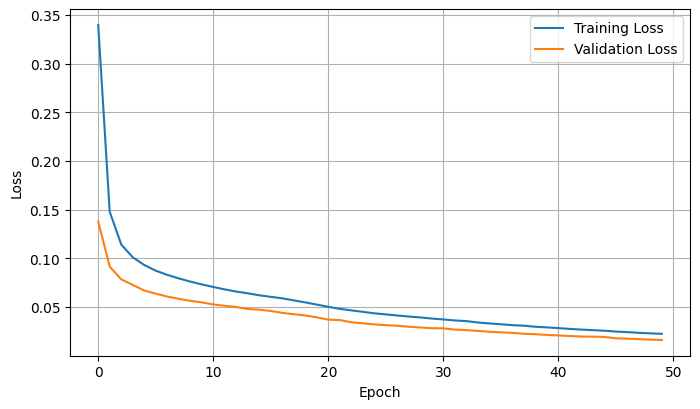

Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio



Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio



Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio



Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio



Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio



Evaluating optimal model with compression 4
Layer paddings = [ True]
Layer channels = [1 1 1]
Parameters:
	- feature_shape: [67, 256]
	- n_layers: 2
	- latent_factor: 4
	- filter_width: 20
	- filter_height: 20
	- regularization: 1e-09

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape (Reshape)           (None, 67, 256, 1)        0         
                                                                 
 conv2d (Conv2D)             (None, 67, 256, 1)        401       
                                                                 
 zero_padding2d (ZeroPaddin  (None, 68, 256, 1)        0         
 g2D)                                                            
                                                                 
 average_pooling2d (Average  (None, 34, 128, 1)        0         
 Pooling2D)                                                      
                 

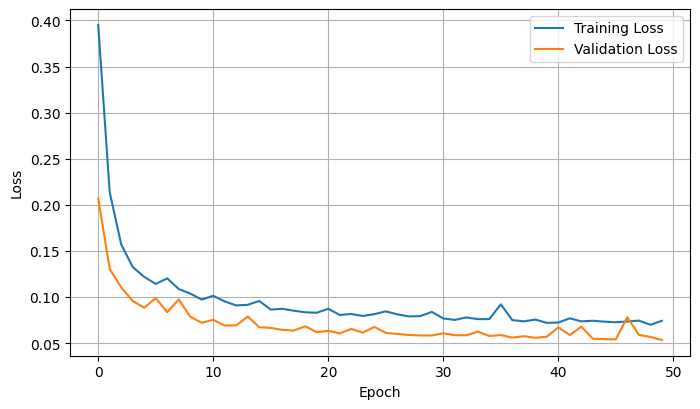

Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio



Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio



Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio



Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio



Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio



Evaluating optimal model with compression 8
Layer paddings = [ True False]
Layer channels = [2 2 2 1]
Parameters:
	- feature_shape: [67, 256]
	- n_layers: 3
	- latent_factor: 8
	- filter_width: 16
	- filter_height: 8
	- regularization: 1e-06

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape (Reshape)           (None, 67, 256, 1)        0         
                                                                 
 conv2d (Conv2D)             (None, 67, 256, 2)        258       
                                                                 
 zero_padding2d (ZeroPaddin  (None, 68, 256, 2)        0         
 g2D)                                                            
                                                                 
 average_pooling2d (Average  (None, 34, 128, 2)        0         
 Pooling2D)                                                      
          

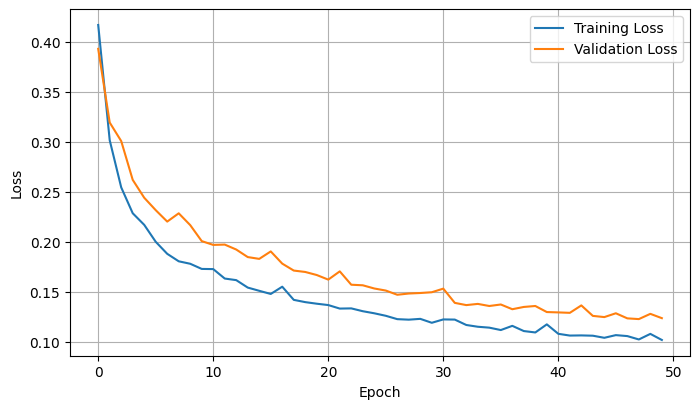

Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio



Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


/opt/conda/lib/python3.10/site-packages/IPython/lib/display.py:187: RuntimeWarning: invalid value encountered in divide
  scaled = data / normalization_factor * 32767


Reconstructed Audio



Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio



Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio



Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio



Evaluating optimal model with compression 16
Layer paddings = [ True False]
Layer channels = [1 1 1 1]
Parameters:
	- feature_shape: [67, 256]
	- n_layers: 3
	- latent_factor: 16
	- filter_width: 12
	- filter_height: 4
	- regularization: 1e-10

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape (Reshape)           (None, 67, 256, 1)        0         
                                                                 
 conv2d (Conv2D)             (None, 67, 256, 1)        49        
                                                                 
 zero_padding2d (ZeroPaddin  (None, 68, 256, 1)        0         
 g2D)                                                            
                                                                 
 average_pooling2d (Average  (None, 34, 128, 1)        0         
 Pooling2D)                                                      
        

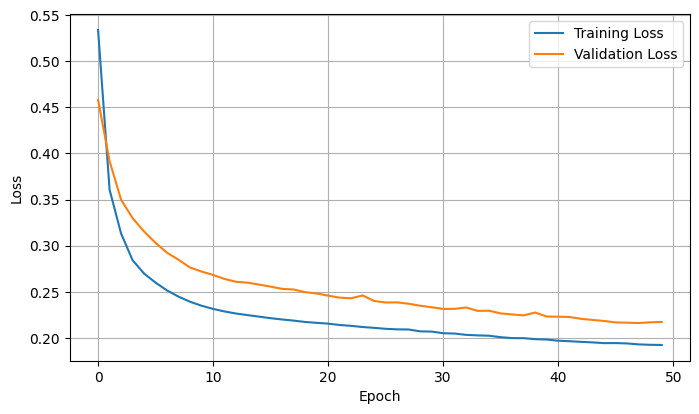

Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio



Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio



Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio



Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio



Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio



Evaluating optimal model with compression 32
Layer paddings = [ True False  True]
Layer channels = [2 2 2 2 1]
Parameters:
	- feature_shape: [67, 256]
	- n_layers: 4
	- latent_factor: 32
	- filter_width: 12
	- filter_height: 8
	- regularization: 1e-09

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape (Reshape)           (None, 67, 256, 1)        0         
                                                                 
 conv2d (Conv2D)             (None, 67, 256, 2)        194       
                                                                 
 zero_padding2d (ZeroPaddin  (None, 68, 256, 2)        0         
 g2D)                                                            
                                                                 
 average_pooling2d (Average  (None, 34, 128, 2)        0         
 Pooling2D)                                                      


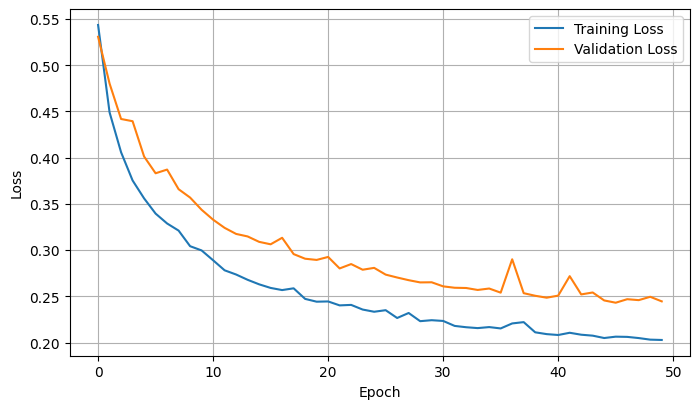

Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio



Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio



Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio



Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio



Picking Sample
Autencoding
Postprocessing
Reconstructing Audio
Original Audio


Reconstructed Audio


In [27]:
# Test best performing models
latent_factors = [2, 4, 8, 16, 32]
base_name = "convolutional"
best_params = {}
best_losses = {}
for latent_factor in latent_factors:
    print(f"Evaluating optimal model with compression {latent_factor}")
    latent_name = base_name + f"_latent{latent_factor}"
    name = latent_name + "_optimal"
    
    # Print parameters
    autoencoder, params, history = load_autoencoder(name)
    print("Parameters:")
    for key, value in params.items():
        print(f"\t- {key}: {value}")
    print()
        
    # Print model summary
    autoencoder.encoder.summary()
    autoencoder.decoder.summary()
    
    # Plot history
    fig, ax = plot_autoencoder_history(history)
    plt.show()
    
    # Save parameters and losses
    for key, value in params.items():
        best_params[key] = [*best_params.get(key, []), value]
    for key, loss in history.items():
        best_losses[key] = [*best_losses.get(key, []), loss[-1]]
    
    # Test autoencoder on samples
    n_tests = 5
    for test in range(n_tests):
        test_autoencoder(autoencoder, plot_transforms=False, plot_raw_transforms=False, plot_waveforms=False)
        
    free_memory(autoencoder)

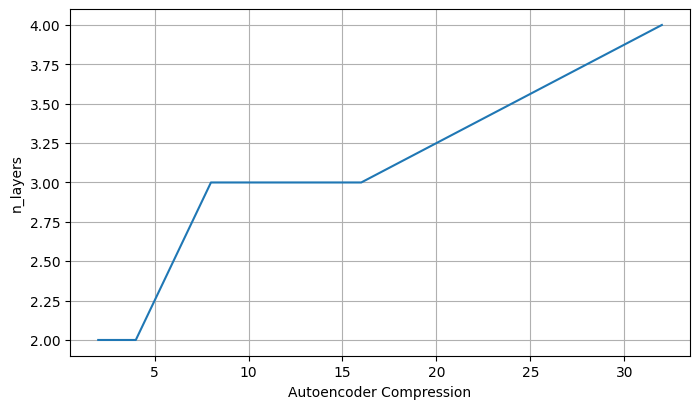

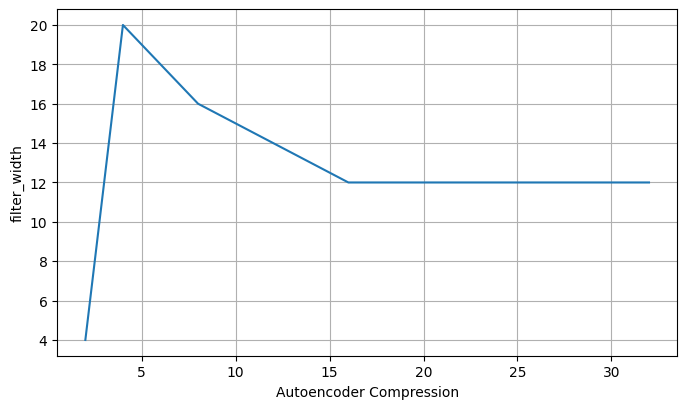

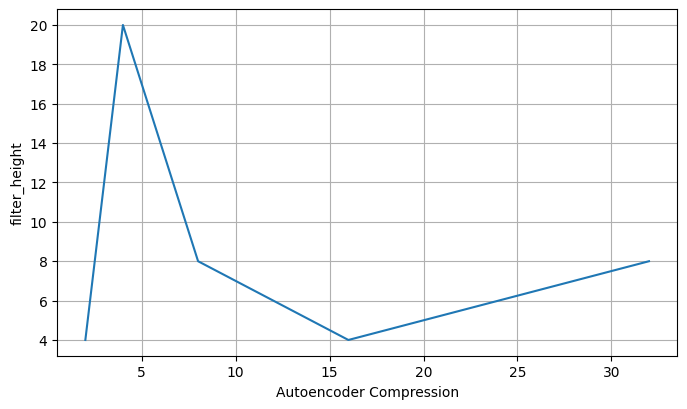

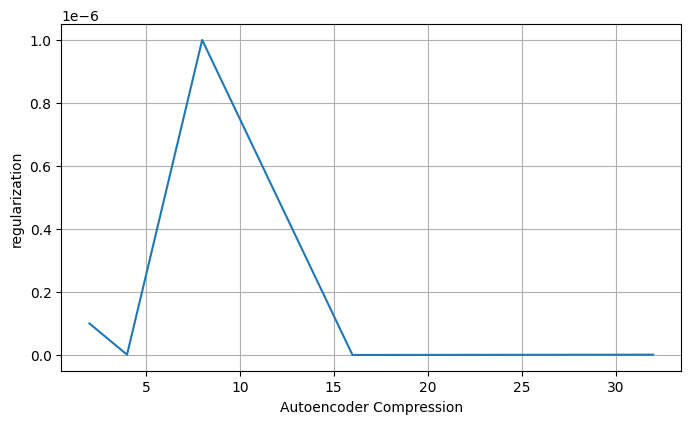

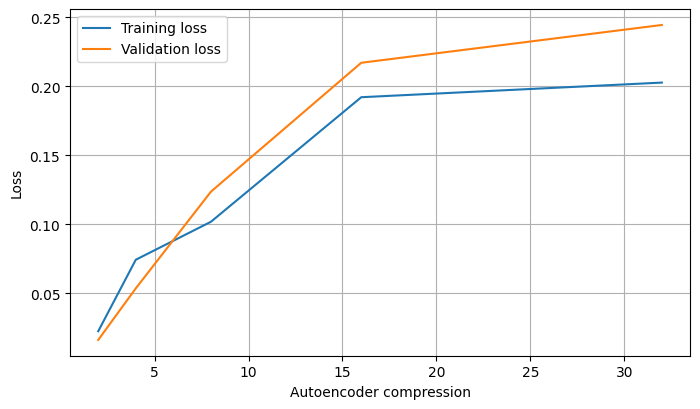

In [29]:
# Make loss & parameter plots in function of network compression
for param, values in best_params.items():
    if param in ["feature_shape", "latent_factor"]:
        continue
    
    fig, ax = make_figax()
    ax.plot(latent_factors, values)
    ax.set_xlabel("Autoencoder Compression")
    ax.set_ylabel(param)
    ax.grid()
    plt.show()
    
fig, ax = make_figax()
train_loss = best_losses["loss"]
val_loss = best_losses["val_loss"]
ax.plot(latent_factors, train_loss, label="Training loss")
ax.plot(latent_factors, val_loss, label="Validation loss")
ax.set_xlabel("Autoencoder compression")
ax.set_ylabel("Loss")
ax.legend()
ax.grid()
plt.show()

### Variational Convolutional Autoencoder

In [33]:
@krs.saving.register_keras_serializable()
class VariationalAutoEncoder(krs.models.Model):
    def __init__(self, feature_shape, latent_factor, n_layers, filter_width=3, filter_height=3, regularization=1e-5, kl_weight=1e-6):
        super().__init__()

        # Save variables
        self.feature_shape = feature_shape
        self.filter_shape = (filter_width, filter_height)
        self.n_time, self.n_channels = self.feature_shape      
        self.latent_factor = latent_factor
        self.n_layers = n_layers
        self.regularization = regularization
        self.kl_weight = kl_weight
        self.latent_channels = int(4**(self.n_layers - 1) / self.latent_factor) # Each layer the width & height halve
        if self.latent_channels < 1:
            print("WARNING: The chosen compression is incompatible with the network topology")
            self.latent_channels = 1
            self.latent_factor = 4**(self.n_layers - 1)
            print(f"Using 1 latent channel, resulting in compression = {self.latent_factor}")
            assert False
        
        # Time dimension can be anything -- add padding where needed
        self.layer_paddings = np.zeros(n_layers - 1, dtype = bool)
        x = self.n_time
        for i in range(n_layers - 1):
            padding = x % 2
            self.layer_paddings[i] = padding == 1
            x = (x + padding) // 2
        print(f"Layer paddings = {self.layer_paddings}")
        
        # Loss trackers
        self.total_loss_tracker = krs.metrics.Mean(name="total_loss")
        self.reconstruction_loss_tracker = krs.metrics.Mean(name="reconstruction_loss")
        self.kl_loss_tracker = krs.metrics.Mean(name="kl_loss")
        

        # Figure out hidden layer sizes
        encoder_channels = np.logspace(np.log2(1), np.log2(self.latent_channels) + 1, self.n_layers + 1, base=2, endpoint=True)
        encoder_channels = np.ceil(encoder_channels).astype(int)
        decoder_channels = np.logspace(np.log2(1), np.log2(self.latent_channels), self.n_layers + 1, base=2, endpoint = True)
        decoder_channels = np.ceil(decoder_channels).astype(int)
        print(f"Encoder channels = {encoder_channels}")
        print(f"Decoder channels = {decoder_channels}")

        # Autoencoder = encoder + decoder
        self.encoder = krs.models.Sequential()
        self.decoder = krs.models.Sequential()
        
        # Add channels dimension to spectrum
        self.encoder.add(
            krs.layers.Reshape(
                (self.n_time, self.n_channels, 1),
                input_shape=(self.n_time, self.n_channels)
            )
        )

        # Add layers to autoencoders
        for layer in range(self.n_layers):
            # Add encoder layer
            ## Convolution layer
            n_channels = encoder_channels[layer + 1]
            self.encoder.add(
                krs.layers.Conv2D(
                    n_channels,
                    self.filter_shape,
                    padding="same",
                    activation="relu",
                    use_bias=True,
                    kernel_regularizer=krs.regularizers.L2(regularization),
                    bias_regularizer=krs.regularizers.L2(regularization),
                )
            )
            ## All except last encoder layer
            if layer < self.n_layers - 1:
                ## Padding if necessary
                add_padding = self.layer_paddings[layer]
                if add_padding:
                    self.encoder.add(
                        krs.layers.ZeroPadding2D(
                            padding=((0, 1),(0, 0))
                        )
                    )
                ## Mean pooling layer
                self.encoder.add(
                    krs.layers.AveragePooling2D(
                        pool_size=(2, 2),
                        strides=2,
                    )
                )
            
            # Add Decoder layer
            ## All except first decoder layer
            if layer > 0:
                ## Upsampling layer
                self.decoder.add(
                    krs.layers.UpSampling2D(
                        size=(2, 2),
                    )
                )
                ## Cropping if necessary
                do_cropping = self.layer_paddings[self.n_layers - 1 - layer]
                if do_cropping:
                    self.decoder.add(
                        krs.layers.Cropping2D(
                            cropping=((0, 1), (0, 0))
                        )
                    )
                
            ## Deconvolution layer
            n_channels = decoder_channels[self.n_layers - layer - 1]
            self.decoder.add(
                krs.layers.Conv2DTranspose(
                    decoder_channels,
                    self.filter_shape,
                    padding="same",
                    activation="relu",
                    use_bias=True,
                    kernel_regularizer=krs.regularizers.L2(regularization),
                    bias_regularizer=krs.regularizers.L2(regularization),
                )
            )
            
        
        # Remove channels dimension from spectrum
        self.decoder.add(
            krs.layers.Reshape(
                (self.n_time, self.n_channels),
                input_shape=(self.n_time, self.n_channels, 1),
            )
        )
    
    @property
    def metrics(self):
        return [
            self.total_loss_tracker,
            self.reconstruction_loss_tracker,
            self.kl_loss_tracker,
        ]
    
    def encode(self, x):
        h = self.encoder(x)
        mu, log_sigma2 = tf.split(h, num_or_size_of_splits=2, axis=3)
        return mu, log_sigma2
    
    def reparametrize(self, mu, log_sigma2):
        zeta = tf.random.normal(mu.shape)
        z = mu + tf.exp(log_sigma2) * zeta
        return z
    
    def decode(self, z):
        x_hat = self.decoder(z)
        return x_hat  
    
    def call(self, x):
        mu, log_sigma2 = self.encode(x)
        z = self.reparametrize(mu, log_sigma2)
        x_hat = self.decode(z)
        return x_hat
    
    def compute_loss(self, y, y_hat, mu, log_sigma2):
        mse_loss = tf.reduce_mean((y - y_hat)**2)
        kl_loss = tf.reduce_mean(1/2 * (tf.exp(log_sigma2) + mu**2 - log_sigma2 - 1))
        total_loss = mse_loss + self.kl_weight * kl_loss
        return total_loss, mse_loss, kl_loss
    
    def test_step(self, data):
        x, y = data
        
        mu, log_sigma2 = self.encode(x)
        z = self.reparametrize(mu, log_sigma2)
        y_hat = self.decode(z)
        
        total_loss, mse_loss, kl_loss = self.compute_loss(y, y_hat, mu, log_sigma2)
        
        # Update tracker states
        self.total_loss_tracker.update_state(total_loss)
        self.reconstruction_loss_tracker.update_state(mse_loss)
        self.kl_loss_tracker.update_state(kl_loss)

        # Return losses
        return {
            "loss": self.total_loss_tracker.result(),
            "reconstruction_loss": self.reconstruction_loss_tracker.result(),
            "kl_loss": self.kl_loss_tracker.result(),
        }
    
    def train_step(self, data):
        x, y = data
        
        with tf.GradientTape() as tape:
            mu, log_sigma2 = self.encode(x)
            z = self.reparametrize(mu, log_sigma2)
            y_hat = self.decode(z)

            total_loss, mse_loss, kl_loss = self.compute_loss(y, y_hat, mu, log_sigma2)
            
        # Update tracker states
        self.total_loss_tracker.update_state(total_loss)
        self.reconstruction_loss_tracker.update_state(mse_loss)
        self.kl_loss_tracker.update_state(kl_loss)

        # Apply Gradients
        gradients = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(gradients, self.trainable_weights))

        # Return losses
        return {
            "loss": self.total_loss_tracker.result(),
            "reconstruction_loss": self.reconstruction_loss_tracker.result(),
            "kl_loss": self.kl_loss_tracker.result(),
        }
        
        

In [34]:
default_params = {
    "feature_shape": train_features.shape[1:],
    "n_layers": 3,
    "latent_factor": 8,
    "filter_width": 5,
    "filter_height": 5,
    "regularization": 0.0,
    "kl_weight": 1e-6,
}

def construct_model(params = {}):
    feature_shape = params.get("feature_shape", default_params["feature_shape"])
    n_layers = params.get("n_layers", default_params["n_layers"])
    latent_factor = params.get("latent_factor", default_params["latent_factor"])
    filter_width = params.get("filter_width", default_params["filter_width"])
    filter_height = params.get("filter_height", default_params["filter_height"])
    regularization = params.get("regularization", default_params["regularization"])
    kl_weight = params.get("kl_weight", default_params["kl_weight"])

    autoencoder = VariationalAutoEncoder(feature_shape, latent_factor, n_layers, filter_width, filter_height, regularization, kl_weight)
    
    return autoencoder

In [32]:
autoencoder = construct_model()
autoencoder.compile(optimizer="adam", loss=mse_loss)
history = autoencoder.fit(train_features, train_features, epochs=50, shuffle=True, validation_data=(test_features, test_features), verbose=1)

NameError: name 'VariationalAutoEncoder' is not defined

In [26]:
base_name="variational"
save_autoencoder(autoencoder, default_params, history, f"{base_name}_default")

In [27]:
autoencoder.encoder.summary()
autoencoder.decoder.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape (Reshape)           (None, 67, 256, 1)        0         
                                                                 
 conv2d (Conv2D)             (None, 67, 256, 2)        52        
                                                                 
 zero_padding2d (ZeroPaddin  (None, 68, 256, 2)        0         
 g2D)                                                            
                                                                 
 average_pooling2d (Average  (None, 34, 128, 2)        0         
 Pooling2D)                                                      
                                                                 
 conv2d_1 (Conv2D)           (None, 34, 128, 2)        102       
                                                                 
 average_pooling2d_1 (Avera  (None, 17, 64, 2)         0

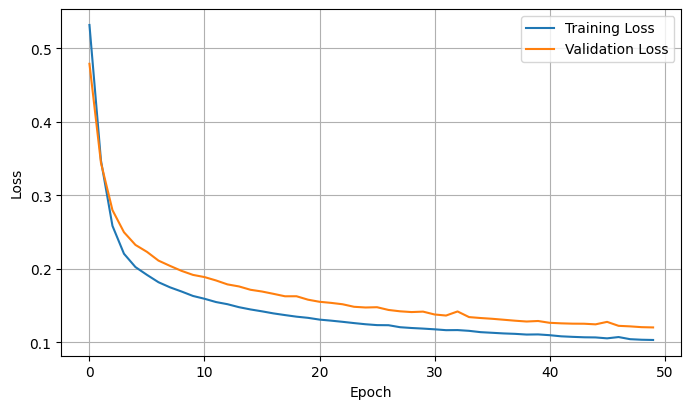

In [28]:
fig, ax = plot_autoencoder_history(history)
plt.show()

Picking Sample
Autencoding
Postprocessing
Plotting transforms


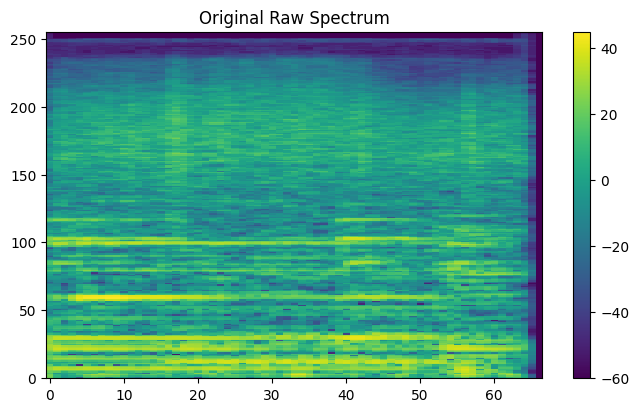

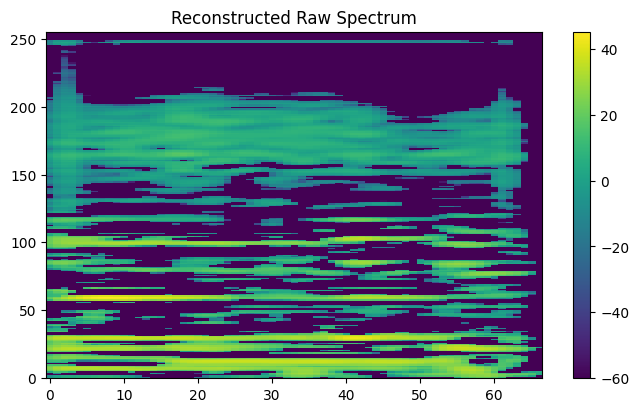

Reconstructing Audio
Original Audio


Reconstructed Audio


In [29]:
test_autoencoder(autoencoder, plot_transforms=False, plot_raw_transforms=True, plot_waveforms=False)

In [30]:
free_memory(autoencoder)

## Two Style Autoencoders

### Two Style Feature Extraction

In [ ]:
# Read data folders
classical_files = os.listdir(cut_classical_path)
jazz_files = os.listdir(cut_jazz_path)

# Define # samples
n_samples = 1000
n_samples = min(n_samples, len(classical_files), len(jazz_files))
print(f"{n_samples = }")

# Pick samples
classical_sample_files = np.random.choice(classical_files, size=n_samples, replace=False)
jazz_sample_files = np.random.choice(jazz_files, size=n_samples, replace=False)

n_samples = 1000


In [ ]:
# Extract features
classical_features = [None] * n_samples
jazz_features = [None] * n_samples

expected_shape = None
for genre_label, genre_features, genre_dir, genre_files in zip(
    ["classical", "jazz"],
    [classical_features, jazz_features],
    [cut_classical_path, cut_jazz_path],
    [classical_sample_files, jazz_sample_files]
):
  print(f"Processing {genre_label} files")
  for i in range(n_samples):
    audio = read_audio(os.path.join(genre_dir, genre_files[i]))
    feature = compute_mels(audio)

    if expected_shape is None:
      expected_shape = feature.shape

    assert feature.shape == expected_shape, f"Audio file {genre_label}/{genre_files[i]} has an unexpected feature shape {feature.shape} != {expected_shape}"

    genre_features[i] = feature

    # Print process
    sys.stdout.write('\r')
    sys.stdout.write(f"{(i+1) / n_samples * 100:.2f} %")
    sys.stdout.flush()
  print()

# Convert feature lists to arrays
classical_features = np.array(classical_features)
jazz_features = np.array(jazz_features)

Processing classical files
99.90 %Processing jazz files
99.90 %

In [ ]:
# Train - Test Split
test_fraction = 0.2
raw_classical_train, raw_classical_test = train_test_split(classical_features, test_size=test_fraction)
raw_jazz_train, raw_jazz_test = train_test_split(jazz_features, test_size=test_fraction)

print(f"{raw_classical_train.shape = }")
print(f"{raw_classical_test.shape = }")
print(f"{raw_jazz_train.shape = }")
print(f"{raw_jazz_test.shape = }")

raw_classical_train.shape = (800, 67, 128)
raw_classical_test.shape = (200, 67, 128)
raw_jazz_train.shape = (800, 67, 128)
raw_jazz_test.shape = (200, 67, 128)


In [ ]:
# Feature normalization weights
classical_frequency_weights = np.reshape(np.std(raw_classical_train, axis=(0,1)), (1, 1, -1))
jazz_frequency_weights = np.reshape(np.std(raw_jazz_train, axis=(0,1)), (1, 1, -1))

In [ ]:
# Feature preprocessing
def preprocess_features(features, frequency_weights, apply_log = True, epsilon=1e-3):
  features = features / (epsilon + frequency_weights)
  if apply_log:
    features = np.log(1 + features)
  return features

def postprocess_features(features, frequency_weights, apply_log = True, epsilon=1e-3):
  if apply_log:
    features = np.exp(features) - 1
  features = features * (epsilon + frequency_weights)
  return features

In [ ]:
# Apply feature normalization
classical_train = preprocess_features(raw_classical_train, classical_frequency_weights)
classical_test = preprocess_features(raw_classical_test, classical_frequency_weights)
jazz_train = preprocess_features(raw_jazz_train, jazz_frequency_weights)
jazz_test = preprocess_features(raw_jazz_test, jazz_frequency_weights)

print(f"{classical_train.shape = }")
print(f"{classical_test.shape = }")
print(f"{jazz_train.shape = }")
print(f"{jazz_test.shape = }")

classical_train.shape = (800, 67, 128)
classical_test.shape = (200, 67, 128)
jazz_train.shape = (800, 67, 128)
jazz_test.shape = (200, 67, 128)


### Two Style Classifier

In [ ]:
# Classify on mean melspectral content
classical_train_prime = np.mean(classical_train, axis=1)
classical_test_prime = np.mean(classical_test, axis=1)
jazz_train_prime = np.mean(jazz_train, axis=1)
jazz_test_prime = np.mean(jazz_test, axis=1)

print(f"{classical_train_prime.shape = }")
print(f"{classical_test_prime.shape = }")
print(f"{jazz_train_prime.shape = }")
print(f"{jazz_test_prime.shape = }")

classical_train_prime.shape = (800, 128)
classical_test_prime.shape = (200, 128)
jazz_train_prime.shape = (800, 128)
jazz_test_prime.shape = (200, 128)


In [ ]:
# Build train set
x_train = np.concatenate([classical_train_prime, jazz_train_prime])
y_train = np.concatenate([np.zeros(len(classical_train_prime)), np.ones(len(jazz_train_prime))])

# Shuffle train set
i_train = np.random.permutation(len(x_train))
x_train = x_train[i_train]
y_train = y_train[i_train]

# Build test set
x_test = np.concatenate([classical_test_prime, jazz_test_prime])
y_test = np.concatenate([np.zeros(len(classical_test_prime)), np.ones(len(jazz_test_prime))])

# Shuffle test set
i_test = np.random.permutation(len(x_test))
x_test = x_test[i_test]
y_test = y_test[i_test]

print(f"{x_train.shape = }")
print(f"{y_train.shape = }")
print(f"{x_test.shape = }")
print(f"{y_test.shape = }")

x_train.shape = (1600, 128)
y_train.shape = (1600,)
x_test.shape = (400, 128)
y_test.shape = (400,)


In [ ]:
# Define classifier
class Classifier(krs.models.Model):
  def __init__(self, n_hidden, regularization=1e-6):
    super().__init__()
    self.n_hidden = n_hidden
    self.regularization = regularization

    self.network = krs.Sequential([
        krs.layers.Dense(self.n_hidden, activation="relu", kernel_regularizer=krs.regularizers.l2(self.regularization)),
        krs.layers.Dense(1, activation="sigmoid", kernel_regularizer=krs.regularizers.l2(self.regularization)),
    ])

  def call(self, x):
    return self.network(x)

In [ ]:
# Initialize classifier
n_hidden = x_train.shape[1] // 4
print(f"{n_hidden = }")
classifier = Classifier(n_hidden)
classifier.compile(optimizer="adam", loss=mse_loss)

n_hidden = 32


In [ ]:
# Train classifier
classifier.fit(x_train, y_train, epochs=25, shuffle=True, validation_data=(x_test, y_test))

Epoch 1/25
50/50 [==============================] - 1s 5ms/step - loss: 0.2090 - val_loss: 0.1842
Epoch 2/25
50/50 [==============================] - 0s 3ms/step - loss: 0.1509 - val_loss: 0.1384
Epoch 3/25
50/50 [==============================] - 0s 3ms/step - loss: 0.1152 - val_loss: 0.1138
Epoch 4/25
50/50 [==============================] - 0s 3ms/step - loss: 0.0948 - val_loss: 0.0980
Epoch 5/25
50/50 [==============================] - 0s 4ms/step - loss: 0.0822 - val_loss: 0.0871
Epoch 6/25
50/50 [==============================] - 0s 3ms/step - loss: 0.0711 - val_loss: 0.0791
Epoch 7/25
50/50 [==============================] - 0s 4ms/step - loss: 0.0632 - val_loss: 0.0733
Epoch 8/25
50/50 [==============================] - 0s 3ms/step - loss: 0.0565 - val_loss: 0.0666
Epoch 9/25
50/50 [==============================] - 0s 4ms/step - loss: 0.0514 - val_loss: 0.0628
Epoch 10/25
50/50 [==============================] - 0s 3ms/step - loss: 0.0474 - val_loss: 0.0586
Epoch 11/25
50/50 [

In [ ]:
# Evaluate accuracy
y_test_hat = classifier.call(x_test)
y_test_hat = np.array(y_test) >= 1/2

errors = np.abs(y_test - y_test_hat)
n_errors = np.sum(errors)
accuracy = 1 - n_errors / len(y_test)

print(f"Classifier accuracy: {accuracy*100:.2f} %")

Classifier accuracy: 100.00 %


### Independent Two Style Variational Autoencoders